In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
#import the dataset
eco_df=pd.read_csv("economy.csv")
bus_df=pd.read_csv("business.csv")

In [3]:
eco_df.head()

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,non-stop,21:05,Mumbai,"5,953"
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,non-stop,08:40,Mumbai,"5,953"
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,non-stop,06:35,Mumbai,"5,956"
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,non-stop,12:35,Mumbai,"5,955"
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,non-stop,11:10,Mumbai,"5,955"


In [4]:
bus_df.head()

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11-02-2022,Air India,AI,868,18:00,Delhi,02h 00m,non-stop,20:00,Mumbai,"25,612"
1,11-02-2022,Air India,AI,624,19:00,Delhi,02h 15m,non-stop,21:15,Mumbai,"25,612"
2,11-02-2022,Air India,AI,531,20:00,Delhi,24h 45m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220"
3,11-02-2022,Air India,AI,839,21:25,Delhi,26h 30m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450"
4,11-02-2022,Air India,AI,544,17:15,Delhi,06h 40m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690"


# Preprocessing

In [5]:
#preprocess the stop feature
bus_df

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11-02-2022,Air India,AI,868,18:00,Delhi,02h 00m,non-stop,20:00,Mumbai,"25,612"
1,11-02-2022,Air India,AI,624,19:00,Delhi,02h 15m,non-stop,21:15,Mumbai,"25,612"
2,11-02-2022,Air India,AI,531,20:00,Delhi,24h 45m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220"
3,11-02-2022,Air India,AI,839,21:25,Delhi,26h 30m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450"
4,11-02-2022,Air India,AI,544,17:15,Delhi,06h 40m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690"
...,...,...,...,...,...,...,...,...,...,...,...
93482,31-03-2022,Vistara,UK,822,09:45,Chennai,10h 05m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,19:50,Hyderabad,"69,265"
93483,31-03-2022,Vistara,UK,826,12:30,Chennai,10h 25m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,22:55,Hyderabad,"77,105"
93484,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"79,099"
93485,31-03-2022,Vistara,UK,828,07:00,Chennai,10h 00m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,17:00,Hyderabad,"81,585"


In [6]:
bus_df.shape

(93487, 11)

In [7]:
eco_df

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,non-stop,21:05,Mumbai,"5,953"
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,non-stop,08:40,Mumbai,"5,953"
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,non-stop,06:35,Mumbai,"5,956"
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,non-stop,12:35,Mumbai,"5,955"
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,non-stop,11:10,Mumbai,"5,955"
...,...,...,...,...,...,...,...,...,...,...,...
206769,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"7,697"
206770,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:55,Hyderabad,"7,709"
206771,31-03-2022,Vistara,UK,826,12:30,Chennai,20h 35m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,09:05,Hyderabad,"8,640"
206772,31-03-2022,Vistara,UK,822,09:45,Chennai,23h 20m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,09:05,Hyderabad,"8,640"


In [8]:
eco_df.shape

(206774, 11)

In [9]:
eco_df["class"]="economy"
bus_df["class"]="business"

In [10]:
eco_df.head()

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,class
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,non-stop,21:05,Mumbai,"5,953",economy
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,non-stop,08:40,Mumbai,"5,953",economy
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,non-stop,06:35,Mumbai,"5,956",economy
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,non-stop,12:35,Mumbai,"5,955",economy
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,non-stop,11:10,Mumbai,"5,955",economy


In [11]:
bus_df.head()

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,class
0,11-02-2022,Air India,AI,868,18:00,Delhi,02h 00m,non-stop,20:00,Mumbai,"25,612",business
1,11-02-2022,Air India,AI,624,19:00,Delhi,02h 15m,non-stop,21:15,Mumbai,"25,612",business
2,11-02-2022,Air India,AI,531,20:00,Delhi,24h 45m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,20:45,Mumbai,"42,220",business
3,11-02-2022,Air India,AI,839,21:25,Delhi,26h 30m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"44,450",business
4,11-02-2022,Air India,AI,544,17:15,Delhi,06h 40m,1-stop\n\t\t\t\t\t\t\t\t\t\t\t\t\n\t\t\t\t\t\t...,23:55,Mumbai,"46,690",business


In [12]:
#concadinte the two data frame
df=pd.concat([eco_df,bus_df],ignore_index=True)

In [13]:
df.head()

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,class
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,non-stop,21:05,Mumbai,"5,953",economy
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,non-stop,08:40,Mumbai,"5,953",economy
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,non-stop,06:35,Mumbai,"5,956",economy
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,non-stop,12:35,Mumbai,"5,955",economy
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,non-stop,11:10,Mumbai,"5,955",economy


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300261 entries, 0 to 300260
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        300261 non-null  object
 1   airline     300261 non-null  object
 2   ch_code     300261 non-null  object
 3   num_code    300261 non-null  int64 
 4   dep_time    300261 non-null  object
 5   from        300261 non-null  object
 6   time_taken  300261 non-null  object
 7   stop        300261 non-null  object
 8   arr_time    300261 non-null  object
 9   to          300261 non-null  object
 10  price       300261 non-null  object
 11  class       300261 non-null  object
dtypes: int64(1), object(11)
memory usage: 27.5+ MB


In [15]:
df.shape

(300261, 12)

In [16]:
df.isnull().sum()

date          0
airline       0
ch_code       0
num_code      0
dep_time      0
from          0
time_taken    0
stop          0
arr_time      0
to            0
price         0
class         0
dtype: int64

In [17]:
df=df.drop_duplicates()

In [18]:
df["stop"] = df.apply(lambda row: int(next((char for char in row["stop"] if char.isnumeric()), 0)), axis=1)

In [19]:
df

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,class
0,11-02-2022,SpiceJet,SG,8709,18:55,Delhi,02h 10m,0,21:05,Mumbai,"5,953",economy
1,11-02-2022,SpiceJet,SG,8157,06:20,Delhi,02h 20m,0,08:40,Mumbai,"5,953",economy
2,11-02-2022,AirAsia,I5,764,04:25,Delhi,02h 10m,0,06:35,Mumbai,"5,956",economy
3,11-02-2022,Vistara,UK,995,10:20,Delhi,02h 15m,0,12:35,Mumbai,"5,955",economy
4,11-02-2022,Vistara,UK,963,08:50,Delhi,02h 20m,0,11:10,Mumbai,"5,955",economy
...,...,...,...,...,...,...,...,...,...,...,...,...
300256,31-03-2022,Vistara,UK,822,09:45,Chennai,10h 05m,1,19:50,Hyderabad,"69,265",business
300257,31-03-2022,Vistara,UK,826,12:30,Chennai,10h 25m,1,22:55,Hyderabad,"77,105",business
300258,31-03-2022,Vistara,UK,832,07:05,Chennai,13h 50m,1,20:55,Hyderabad,"79,099",business
300259,31-03-2022,Vistara,UK,828,07:00,Chennai,10h 00m,1,17:00,Hyderabad,"81,585",business


In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 300259 entries, 0 to 300260
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   date        300259 non-null  object
 1   airline     300259 non-null  object
 2   ch_code     300259 non-null  object
 3   num_code    300259 non-null  int64 
 4   dep_time    300259 non-null  object
 5   from        300259 non-null  object
 6   time_taken  300259 non-null  object
 7   stop        300259 non-null  int64 
 8   arr_time    300259 non-null  object
 9   to          300259 non-null  object
 10  price       300259 non-null  object
 11  class       300259 non-null  object
dtypes: int64(2), object(10)
memory usage: 29.8+ MB


In [21]:
from datetime import datetime
df["date"]=pd.to_datetime(df.date)

C:\Users\elcot\AppData\Local\Temp\ipykernel_11804\3721637229.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df["date"]=pd.to_datetime(df.date)


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 300259 entries, 0 to 300260
Data columns (total 12 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   date        300259 non-null  datetime64[ns]
 1   airline     300259 non-null  object        
 2   ch_code     300259 non-null  object        
 3   num_code    300259 non-null  int64         
 4   dep_time    300259 non-null  object        
 5   from        300259 non-null  object        
 6   time_taken  300259 non-null  object        
 7   stop        300259 non-null  int64         
 8   arr_time    300259 non-null  object        
 9   to          300259 non-null  object        
 10  price       300259 non-null  object        
 11  class       300259 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(9)
memory usage: 29.8+ MB


In [23]:
df

,date,airline,ch_code,num_code,dep_time,from,time_taken,stop,arr_time,to,price,class
0,2022-11-02,SpiceJet,SG,8709,18:55,Delhi,02h 10m,0,21:05,Mumbai,"5,953",economy
1,2022-11-02,SpiceJet,SG,8157,06:20,Delhi,02h 20m,0,08:40,Mumbai,"5,953",economy
2,2022-11-02,AirAsia,I5,764,04:25,Delhi,02h 10m,0,06:35,Mumbai,"5,956",economy
3,2022-11-02,Vistara,UK,995,10:20,Delhi,02h 15m,0,12:35,Mumbai,"5,955",economy
4,2022-11-02,Vistara,UK,963,08:50,Delhi,02h 20m,0,11:10,Mumbai,"5,955",economy
...,...,...,...,...,...,...,...,...,...,...,...,...
300256,2022-03-31,Vistara,UK,822,09:45,Chennai,10h 05m,1,19:50,Hyderabad,"69,265",business
300257,2022-03-31,Vistara,UK,826,12:30,Chennai,10h 25m,1,22:55,Hyderabad,"77,105",business
300258,2022-03-31,Vistara,UK,832,07:05,Chennai,13h 50m,1,20:55,Hyderabad,"79,099",business
300259,2022-03-31,Vistara,UK,828,07:00,Chennai,10h 00m,1,17:00,Hyderabad,"81,585",business


In [24]:
df["fli_code"]=df.apply(lambda row: row["ch_code"]+'-'+str(row["num_code"]),axis=1)

In [25]:
df=df.drop(columns=["ch_code","num_code"],axis=1)

In [26]:
df

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code
0,2022-11-02,SpiceJet,18:55,Delhi,02h 10m,0,21:05,Mumbai,"5,953",economy,SG-8709
1,2022-11-02,SpiceJet,06:20,Delhi,02h 20m,0,08:40,Mumbai,"5,953",economy,SG-8157
2,2022-11-02,AirAsia,04:25,Delhi,02h 10m,0,06:35,Mumbai,"5,956",economy,I5-764
3,2022-11-02,Vistara,10:20,Delhi,02h 15m,0,12:35,Mumbai,"5,955",economy,UK-995
4,2022-11-02,Vistara,08:50,Delhi,02h 20m,0,11:10,Mumbai,"5,955",economy,UK-963
...,...,...,...,...,...,...,...,...,...,...,...
300256,2022-03-31,Vistara,09:45,Chennai,10h 05m,1,19:50,Hyderabad,"69,265",business,UK-822
300257,2022-03-31,Vistara,12:30,Chennai,10h 25m,1,22:55,Hyderabad,"77,105",business,UK-826
300258,2022-03-31,Vistara,07:05,Chennai,13h 50m,1,20:55,Hyderabad,"79,099",business,UK-832
300259,2022-03-31,Vistara,07:00,Chennai,10h 00m,1,17:00,Hyderabad,"81,585",business,UK-828


In [27]:
df["dep_time"]=pd.to_datetime(df['dep_time'])
df["arr_time"]=pd.to_datetime(df['arr_time'])

In [28]:
df["time_taken"]=df["arr_time"]-df["dep_time"]

In [29]:
df.head()

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code
0,2022-11-02,SpiceJet,2023-04-28 18:55:00,Delhi,0 days 02:10:00,0,2023-04-28 21:05:00,Mumbai,"5,953",economy,SG-8709
1,2022-11-02,SpiceJet,2023-04-28 06:20:00,Delhi,0 days 02:20:00,0,2023-04-28 08:40:00,Mumbai,"5,953",economy,SG-8157
2,2022-11-02,AirAsia,2023-04-28 04:25:00,Delhi,0 days 02:10:00,0,2023-04-28 06:35:00,Mumbai,"5,956",economy,I5-764
3,2022-11-02,Vistara,2023-04-28 10:20:00,Delhi,0 days 02:15:00,0,2023-04-28 12:35:00,Mumbai,"5,955",economy,UK-995
4,2022-11-02,Vistara,2023-04-28 08:50:00,Delhi,0 days 02:20:00,0,2023-04-28 11:10:00,Mumbai,"5,955",economy,UK-963


In [30]:
#days taking column created
df["days_taken"]=df['time_taken'].dt.days

In [31]:
#time taken of travel in minutes
df['time']=df['time_taken'].dt.components.hours*60 + df["time_taken"].dt.components.minutes

In [32]:
df["time_taken"]=df["time"].apply(lambda x:round((x/60),2))

In [33]:
df["dep_time"]=df["dep_time"].dt.time
df["arr_time"]=df["arr_time"].dt.time

In [34]:
df=df.drop(columns=["days_taken","time"],axis=1)

In [35]:
df.head()

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code
0,2022-11-02,SpiceJet,18:55:00,Delhi,2.17,0,21:05:00,Mumbai,"5,953",economy,SG-8709
1,2022-11-02,SpiceJet,06:20:00,Delhi,2.33,0,08:40:00,Mumbai,"5,953",economy,SG-8157
2,2022-11-02,AirAsia,04:25:00,Delhi,2.17,0,06:35:00,Mumbai,"5,956",economy,I5-764
3,2022-11-02,Vistara,10:20:00,Delhi,2.25,0,12:35:00,Mumbai,"5,955",economy,UK-995
4,2022-11-02,Vistara,08:50:00,Delhi,2.33,0,11:10:00,Mumbai,"5,955",economy,UK-963


In [36]:
df["price"]=pd.to_numeric(df['price'].str.replace(',',''))

In [37]:
df.head()

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code
0,2022-11-02,SpiceJet,18:55:00,Delhi,2.17,0,21:05:00,Mumbai,5953,economy,SG-8709
1,2022-11-02,SpiceJet,06:20:00,Delhi,2.33,0,08:40:00,Mumbai,5953,economy,SG-8157
2,2022-11-02,AirAsia,04:25:00,Delhi,2.17,0,06:35:00,Mumbai,5956,economy,I5-764
3,2022-11-02,Vistara,10:20:00,Delhi,2.25,0,12:35:00,Mumbai,5955,economy,UK-995
4,2022-11-02,Vistara,08:50:00,Delhi,2.33,0,11:10:00,Mumbai,5955,economy,UK-963


In [38]:
df.describe()

,time_taken,stop,price
count,300259.000000,300259.000000,300259.000000
mean,9.947963,0.924212,20883.800386
std,6.000962,0.398189,22695.962230
min,0.000000,0.000000,1105.000000
25%,5.330000,1.000000,4783.000000
50%,9.580000,1.000000,7425.000000
75%,14.080000,1.000000,42521.000000
max,23.920000,2.000000,123071.000000


# EDA

## univariate analysis

In [39]:
df.columns

Index(['date', 'airline', 'dep_time', 'from', 'time_taken', 'stop', 'arr_time',
       'to', 'price', 'class', 'fli_code'],
      dtype='object')

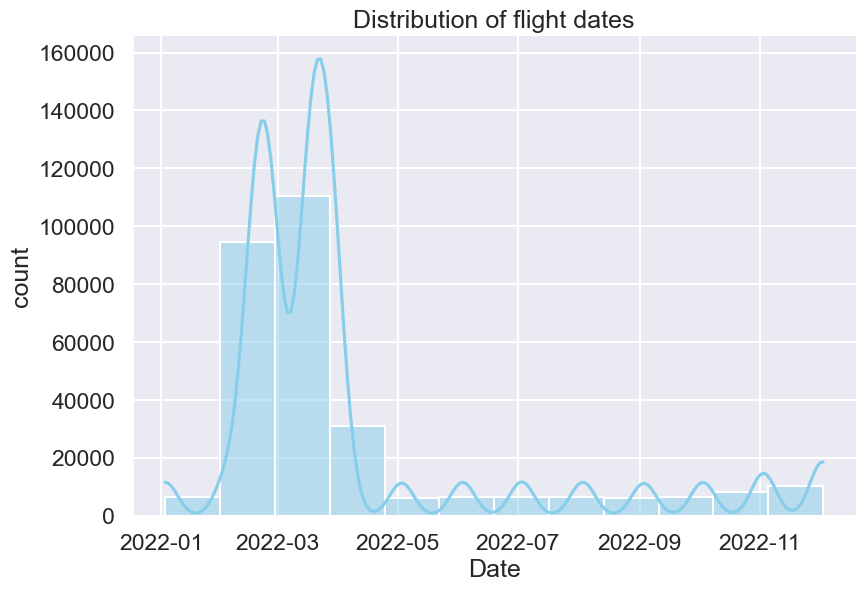

In [63]:
sns.set(style="darkgrid",context="talk")
ax=sns.displot(df["date"],bins=12,color="skyblue",kde=True,height=6,aspect=1.5)
ax.set(title="Distribution of flight dates",xlabel="Date",ylabel="count")

*Most of the flights were flown in **March.** **February and April** were the next busiest months. The remaining months had almost equal levels of flight activity. However, **December,december** had slightly less flight activity compared to the other months.*

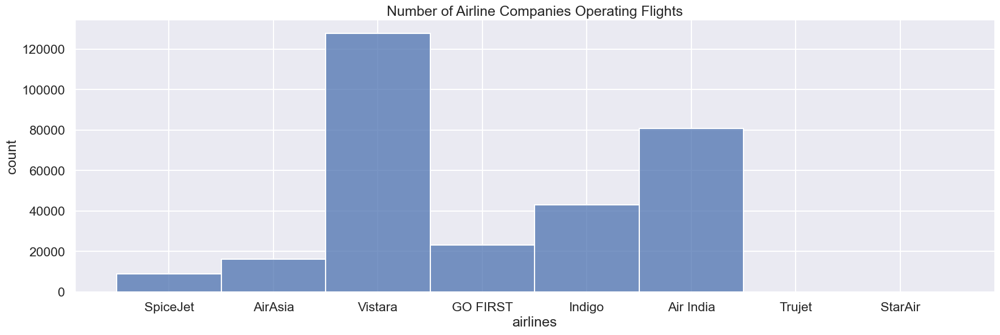

In [82]:
sns.set(style="darkgrid",context="talk")
ax=sns.displot(df["airline"],height=6,aspect=3)
ax.set(title="Number of Airline Companies Operating Flights",xlabel="airlines",ylabel="count")

***Vistara** operated a large number of flights, accounting for nearly **46%** of the total travel occupancy. **Air India** was the second most popular airline for travel. **Trujet and Star Air** had a very limited number of flights operating.*

Text(0.5, 0, 'Depature time')

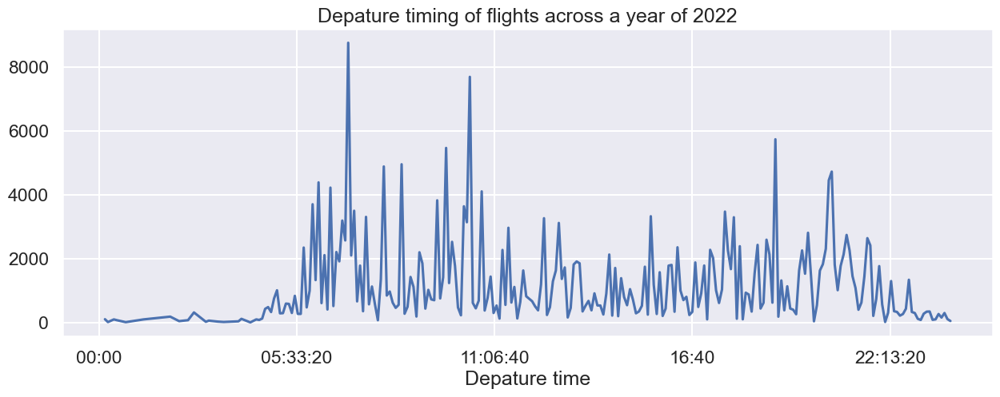

In [95]:
plt.figure(figsize=(15,5))
df["dep_time"].value_counts().plot()
plt.title("Depature timing of flights across a year of 2022")
plt.xlabel("Depature time")


Text(0.5, 0, 'Arrived time')

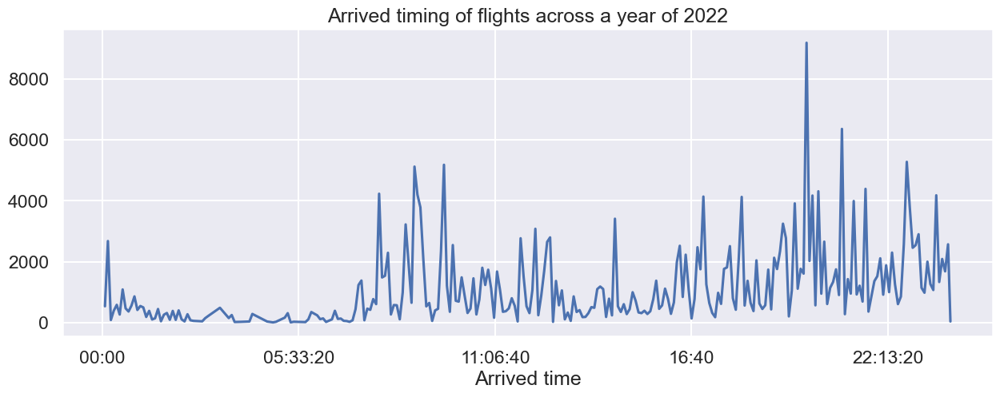

In [94]:
plt.figure(figsize=(15,5))
df["arr_time"].value_counts().plot()
plt.title("Arrived timing of flights across a year of 2022")
plt.xlabel("Arrived time")

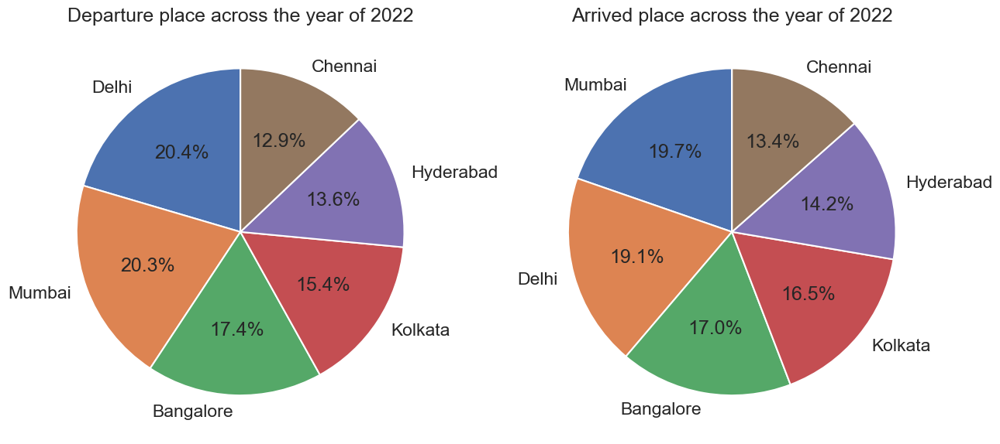

In [102]:
#depature place and depature place
data1=df["from"].value_counts()
data2=df["to"].value_counts()

fig,(ax1,ax2)=plt.subplots(1,2,figsize=(15,8))
sns.set(style='darkgrid',context="talk")

ax1.pie(data1,labels=data1.index,autopct='%1.1f%%',startangle=90)
ax1.set_title("Departure place across the year of 2022")

ax2.pie(data2,labels=data2.index,autopct='%1.1f%%',startangle=90)
ax2.set_title("Arrived place across the year of 2022")
plt.show()

Text(0.5, 1.0, 'Time taken for travelling')

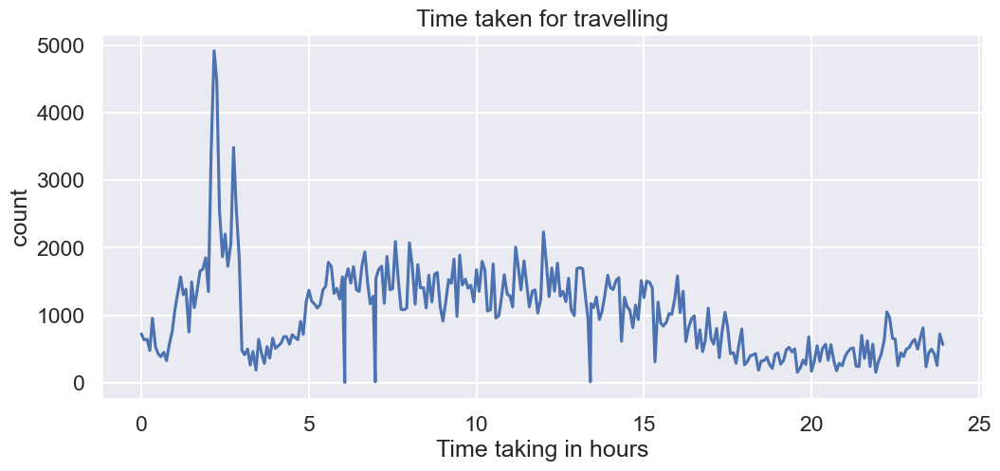

In [115]:
plt.figure(figsize=(12,5))
sns.lineplot(df["time_taken"].value_counts())
plt.xlabel("Time taking in hours")
plt.ylabel("count")
plt.title("Time taken for travelling")

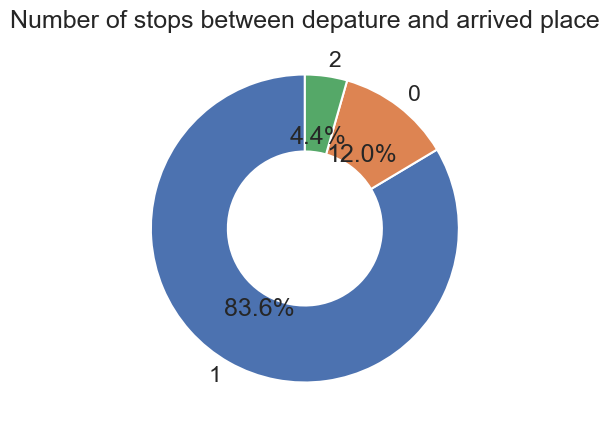

In [126]:
data=df["stop"].value_counts()
plt.figure(figsize=(7,5))
plt.pie(data,labels=data.index,autopct='%1.1f%%',startangle=90,wedgeprops={'width':0.5})
plt.title("Number of stops between depature and arrived place")
plt.show()

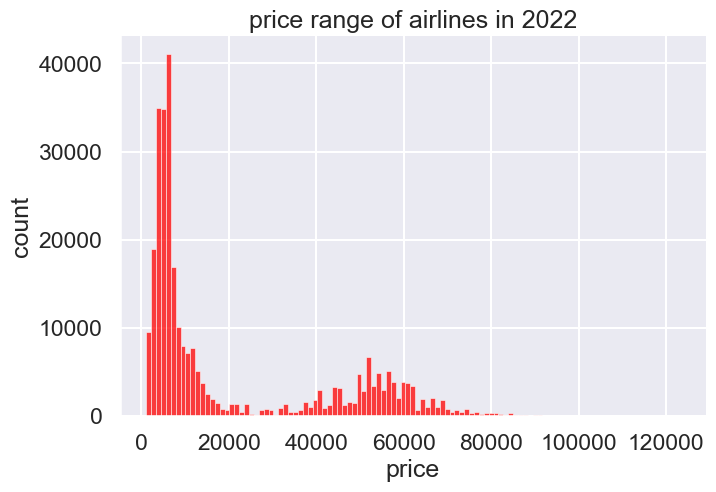

In [142]:
sns.set(style="darkgrid",context="talk")
ax=sns.displot(df["price"],color="red",kde=False,height=5,aspect=1.5)
ax.set(title="price range of airlines in 2022",xlabel="price",ylabel="count")

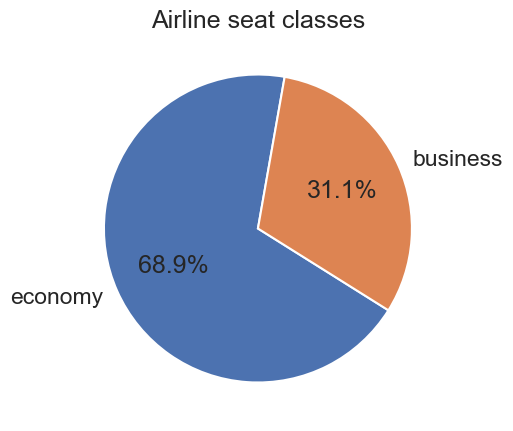

In [151]:
plt.figure(figsize=(5,5))
data=df["class"].value_counts()
sns.set(style='darkgrid',context="talk")
plt.pie(data,labels=data.index,autopct='%1.1f%%',startangle=80)
plt.title("Airline seat classes")
plt.show()

## Bivariate analysis

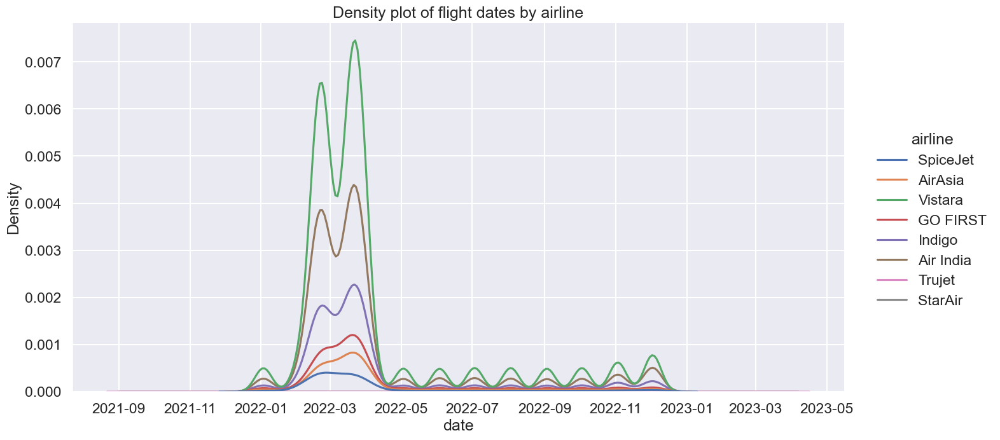

In [172]:
sns.set(style='darkgrid', context='talk')

sns.displot(data=df, x="date", hue="airline", kind="kde", fill=False, height=7, aspect=2)
plt.title("Density plot of flight dates by airline")
plt.show()

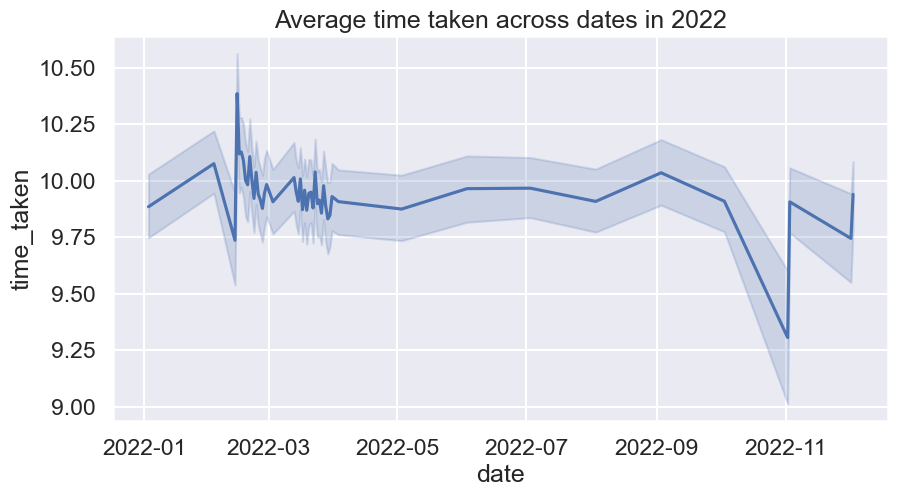

In [181]:
sns.set(style='darkgrid', context='talk')
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="date", y="time_taken")
plt.title("Average time taken across dates in 2022")
plt.show()

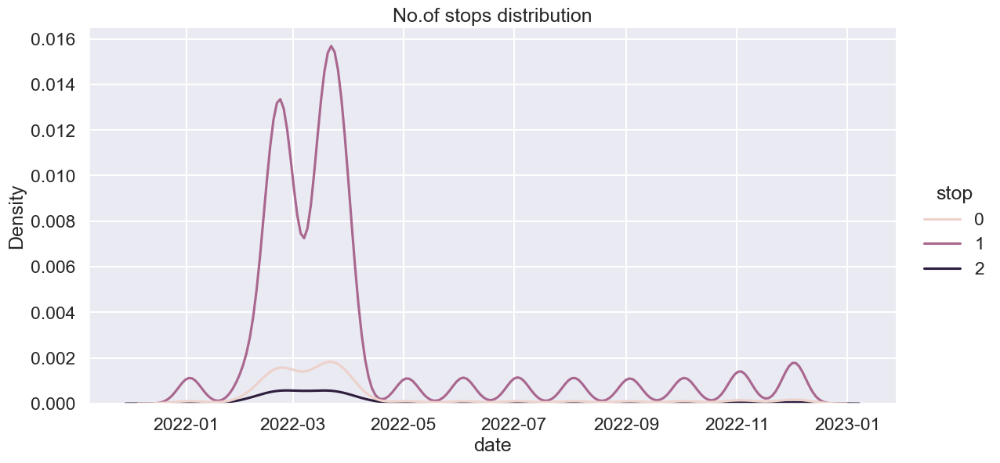

In [184]:
sns.set(style='darkgrid', context='talk')

sns.displot(data=df, x="date", hue="stop", kind="kde", fill=False, height=6, aspect=2)
plt.title("No.of stops distribution")
plt.show()

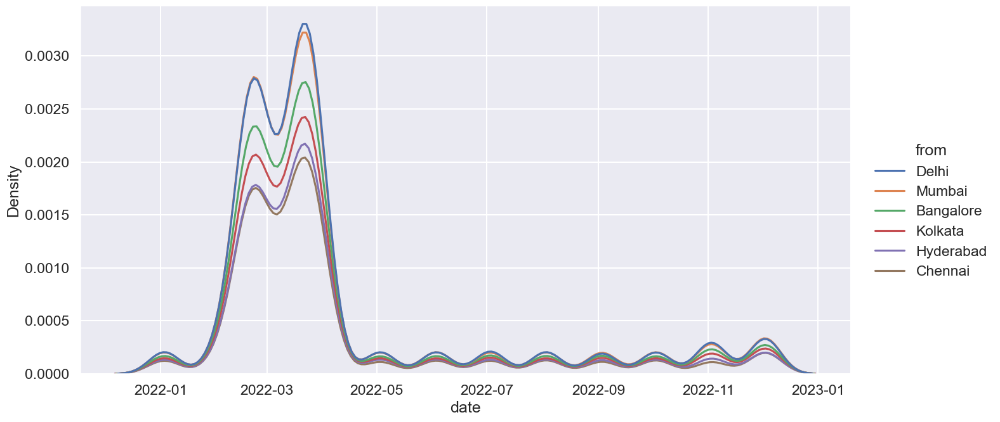

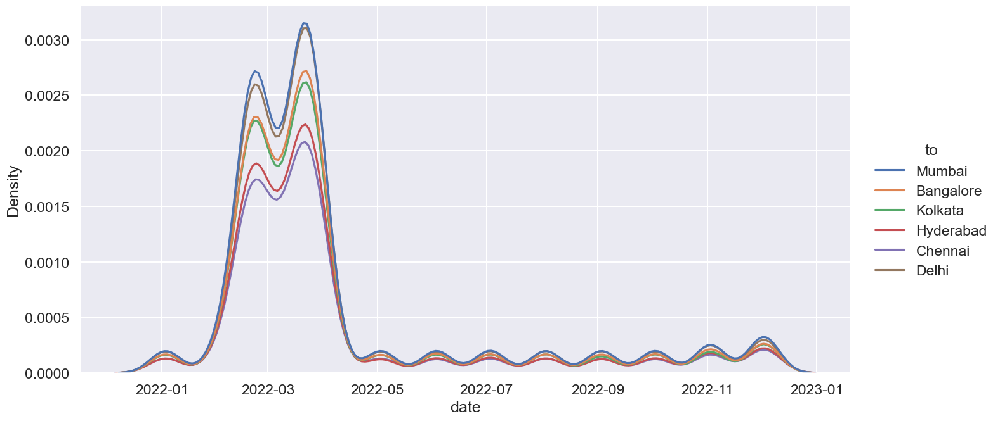

In [186]:
sns.set(style='darkgrid', context='talk')

#fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8))

sns.displot(data=df, x="date", hue="from", kind="kde", fill=False, height=7, aspect=2)
ax1.set_title("Departure place in year of 2022")

sns.displot(data=df, x="date", hue="to", kind="kde", fill=False, height=7, aspect=2)
ax2.set_title("Arrived place in year of 2022")

plt.show()

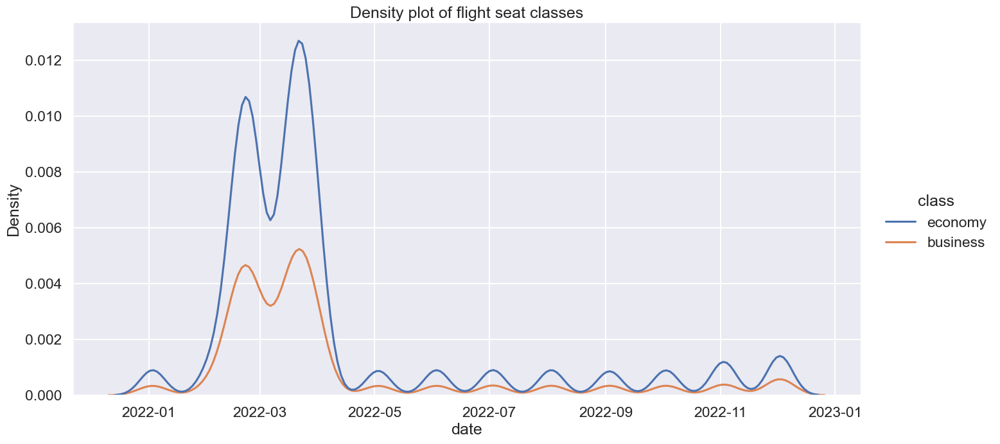

In [197]:
sns.set(style='darkgrid', context='talk')

sns.displot(data=df, x="date", hue="class", kind="kde", fill=False, height=7, aspect=2)
plt.title("Density plot of flight seat classes")
plt.show()

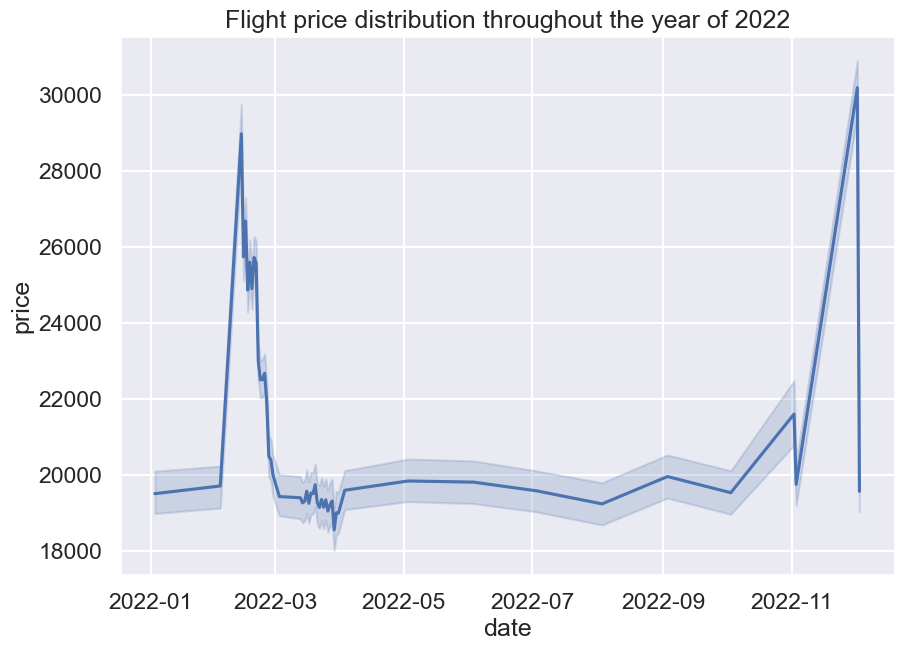

In [343]:
plt.figure(figsize=(10,7))
sns.lineplot(x=df["date"],y=df["price"])
plt.title("Flight price distribution throughout the year of 2022")
plt.show()

Text(0, 0.5, 'Price')

C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


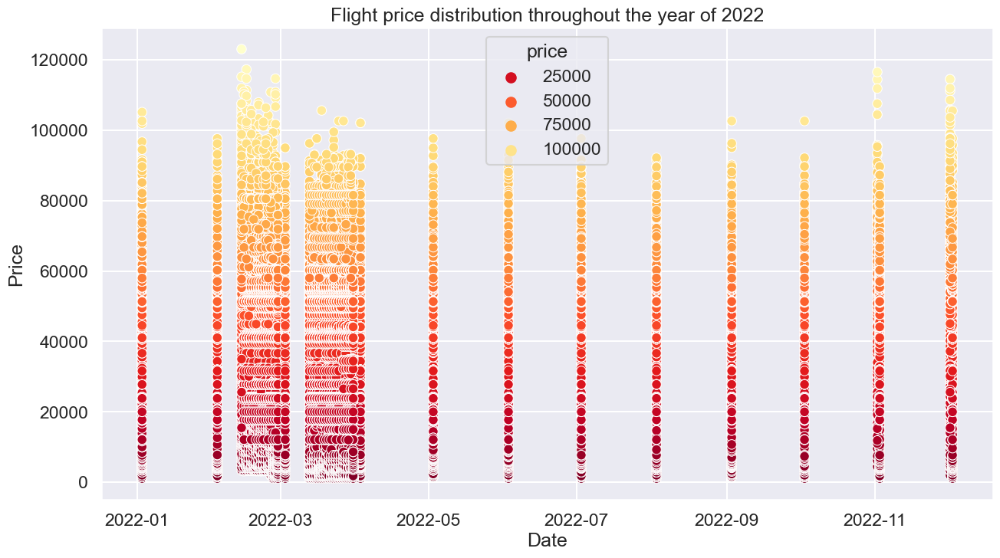

In [200]:
sns.set(style='darkgrid', context='talk')

fig, ax = plt.subplots(figsize=(15,8))

# create a color palette based on the price range
price_palette = sns.color_palette("YlOrRd_r", as_cmap=True)

# create a scatter plot with a color gradient based on price
sns.scatterplot(data=df, x="date", y="price", hue="price", palette=price_palette, ax=ax)

# set the title and axis labels
ax.set_title("Flight price distribution throughout the year of 2022")
ax.set_xlabel("Date")
ax.set_ylabel("Price")

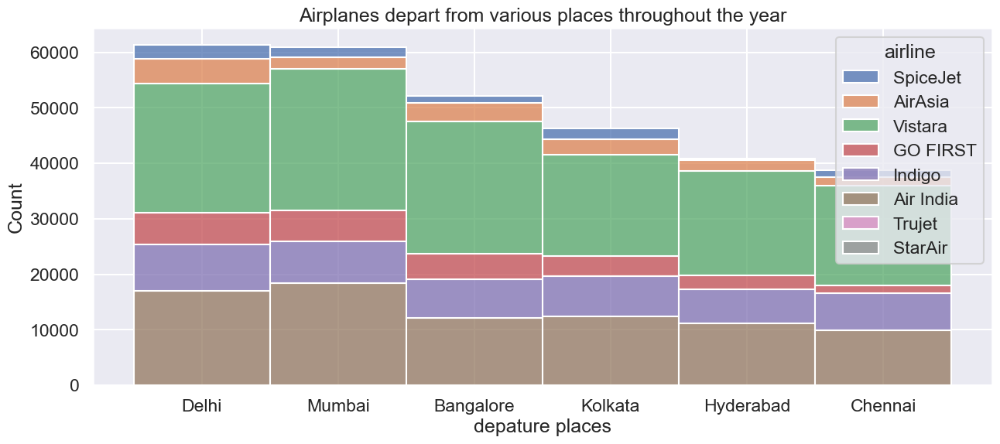

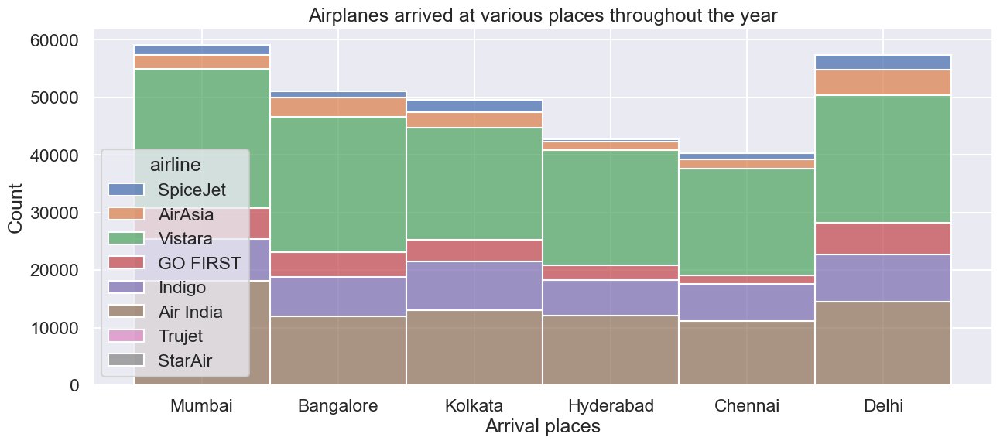

In [287]:
#airline vs depature place
plt.figure(figsize=(15,6))
sns.histplot(data=df, x="from", hue="airline", multiple="stack")
plt.title("Airplanes depart from various places throughout the year")
plt.xlabel("depature places")
plt.show()

#airline vs Arrived place
plt.figure(figsize=(15,6))
sns.histplot(data=df, x="to", hue="airline", multiple="stack")
plt.title("Airplanes arrived at various places throughout the year")
plt.xlabel("Arrival places")
plt.show()

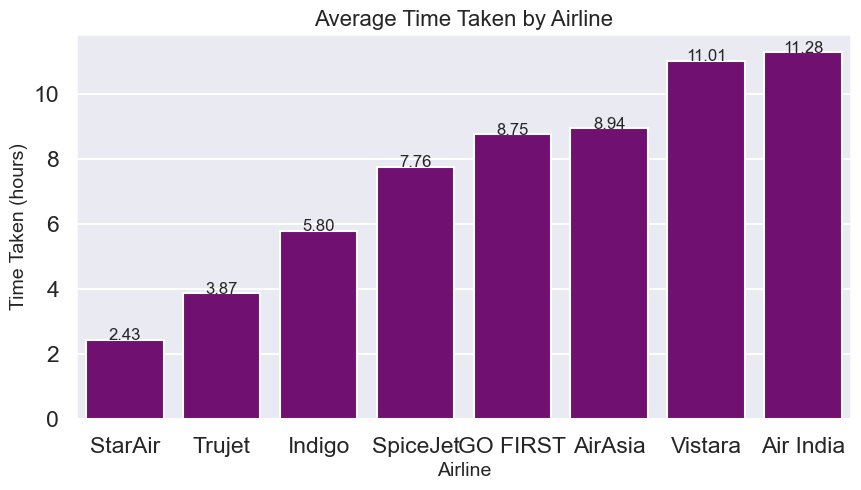

In [299]:
#airline vs time taking of travel

# Calculate the mean time taken for each airline
mean_time = df.groupby(["airline"])["time_taken"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,5))
sns.barplot(x=mean_time.index, y=mean_time.values, color="purple")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"{v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Average Time Taken by Airline", fontsize=16)
plt.xlabel("Airline", fontsize=14)
plt.ylabel("Time Taken (hours)", fontsize=14)

# Show the plot
plt.show()


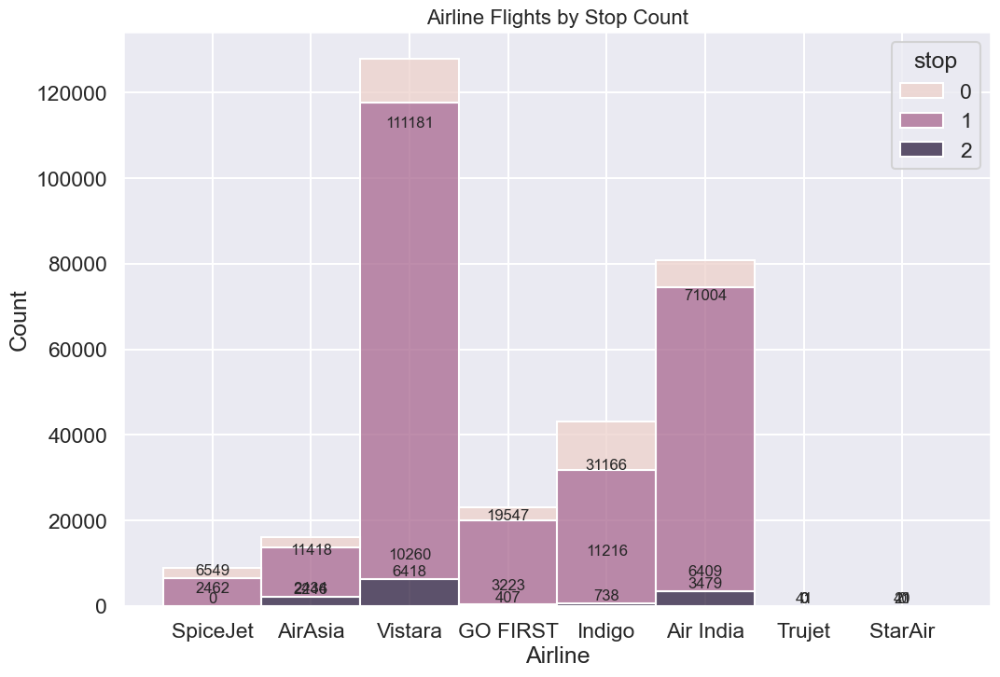

In [307]:
# airline vs number of stops

plt.figure(figsize=(12,8))
ax = sns.histplot(data=df, x="airline", hue="stop", multiple="stack")

# Add count labels to the bars
for patch in ax.patches:
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f"{int(y)}", (x, y), ha="center", va="bottom", fontsize=12)

# Set the title and axis labels
plt.title("Airline Flights by Stop Count", fontsize=16)
plt.xlabel("Airline")
plt.ylabel("Count")

# Show the plot
plt.show()

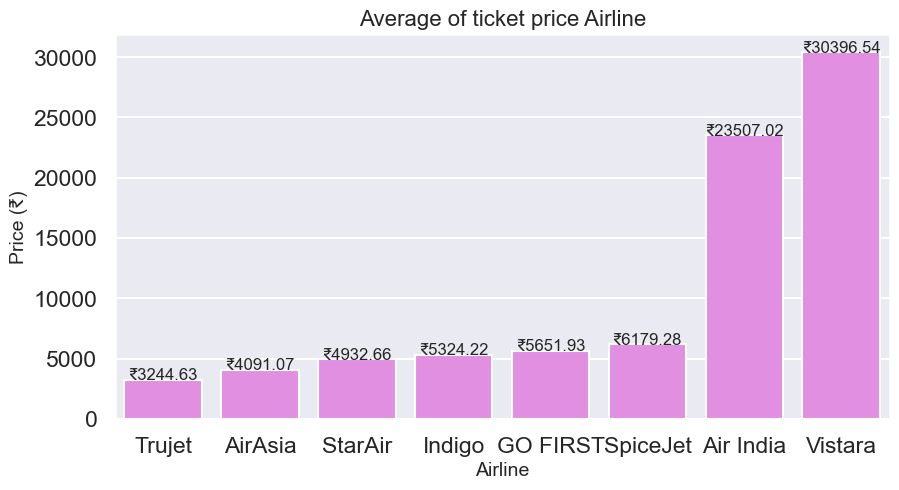

In [311]:
#airline vs price

# Calculate the mean price ticket for each airline
mean_time = df.groupby(["airline"])["price"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,5))
sns.barplot(x=mean_time.index, y=mean_time.values, color="violet")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"₹{v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Average of ticket price Airline", fontsize=16)
plt.xlabel("Airline", fontsize=14)
plt.ylabel("Price (₹)", fontsize=14)

# Show the plot
plt.show()

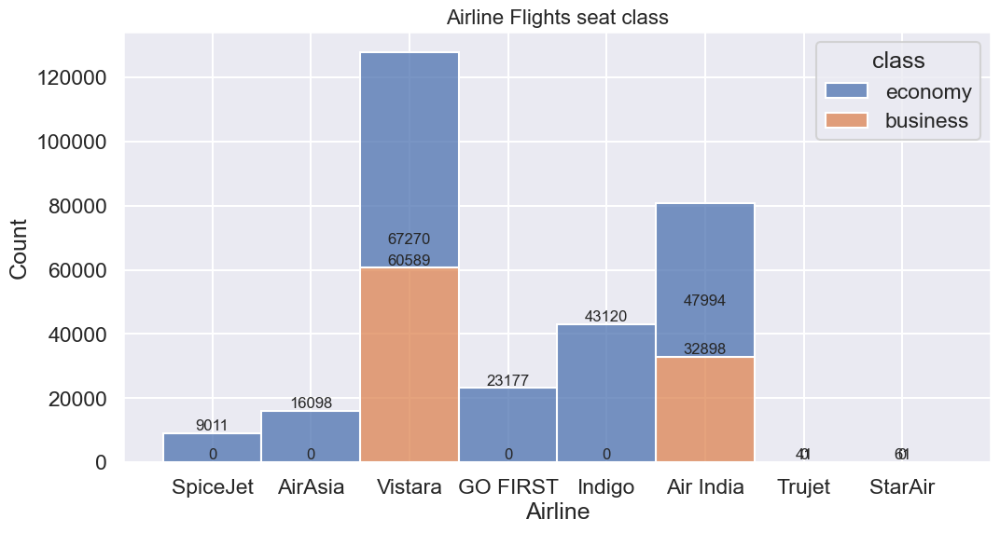

In [318]:
#airline vs seat class
plt.figure(figsize=(12,6))
ax = sns.histplot(data=df, x="airline", hue="class", multiple="stack")

# Add count labels to the bars
for patch in ax.patches:
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f"{int(y)}", (x, y), ha="center", va="bottom", fontsize=12)

# Set the title and axis labels
plt.title("Airline Flights seat class", fontsize=16)
plt.xlabel("Airline")
plt.ylabel("Count")

# Show the plot
plt.show()

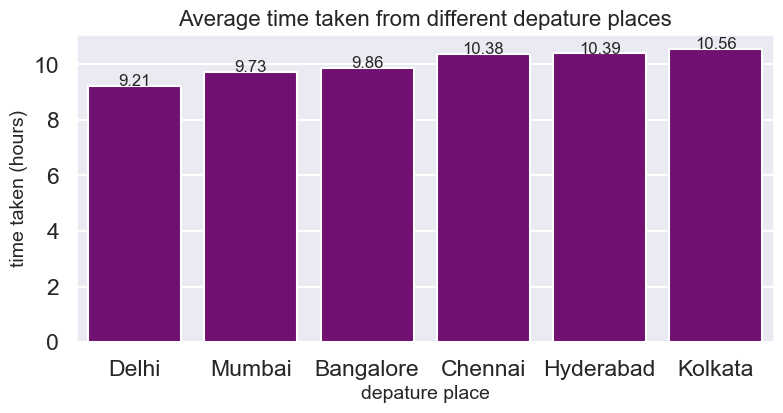

In [330]:
#Depature place vs time taking of travel

# Calculate the mean time taken for each airline
mean_time = df.groupby(["from"])["time_taken"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(9,4))
sns.barplot(x=mean_time.index, y=mean_time.values, color="purple")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"{v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Average time taken from different depature places", fontsize=16)
plt.xlabel("depature place", fontsize=14)
plt.ylabel("time taken (hours)", fontsize=14)

# Show the plot
plt.show()

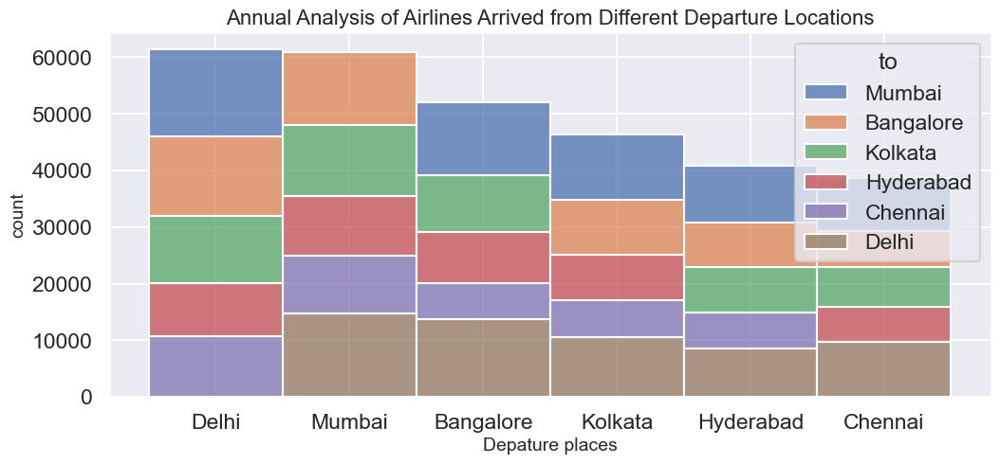

In [341]:
# depature place vs arrived places
plt.figure(figsize=(12,5))
ax = sns.histplot(data=df, x="from", hue="to", multiple="stack")


# Set the title and axis labels
plt.title("Annual Analysis of Airlines Arrived from Different Departure Locations", fontsize=16)
plt.xlabel("Depature places", fontsize=14)
plt.ylabel("count", fontsize=14)

# Show the plot
plt.show()

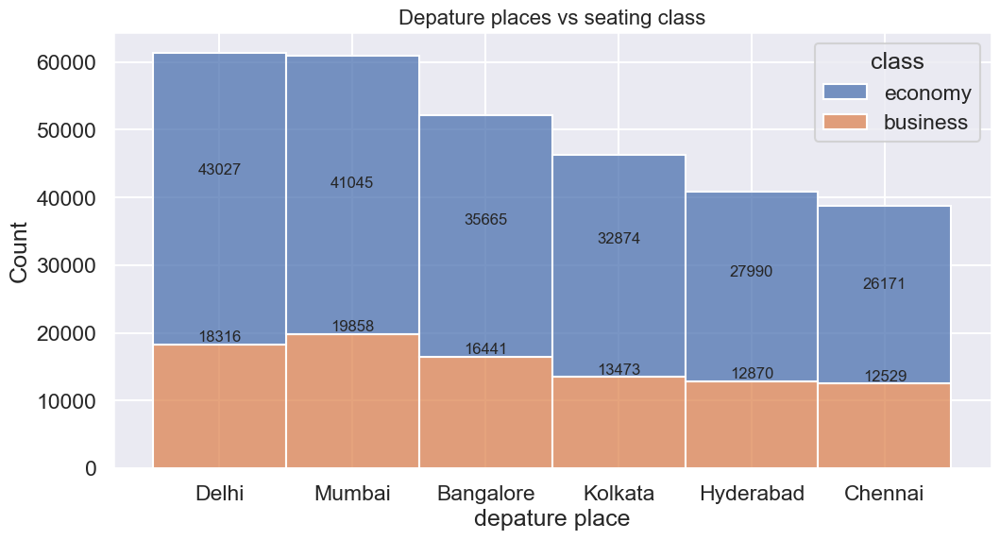

In [346]:
#depature place vs seat class
plt.figure(figsize=(12,6))
ax = sns.histplot(data=df, x="from", hue="class", multiple="stack")

# Add count labels to the bars
for patch in ax.patches:
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f"{int(y)}", (x, y), ha="center", va="bottom", fontsize=12)

# Set the title and axis labels
plt.title("Depature places vs seating class", fontsize=16)
plt.xlabel("depature place")
plt.ylabel("Count")

# Show the plot
plt.show()

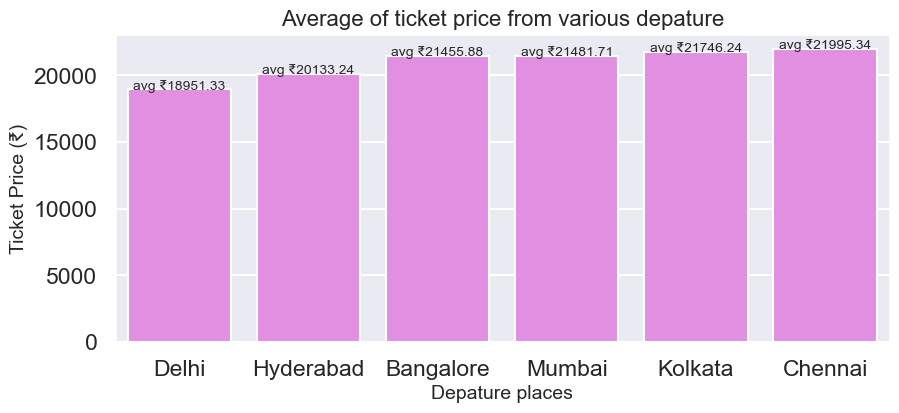

In [345]:
#depature place vs price of the ticket

# Calculate the mean price ticket from various depature place
mean_price = df.groupby(["from"])["price"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,4))
sns.barplot(x=mean_price.index, y=mean_price.values, color="violet")

# Add value labels to the bars
for i, v in enumerate(mean_price.values):
    plt.text(i, v, f"avg ₹{v:.2f}", ha="center", fontsize=10)

# Set the title and axis labels
plt.title("Average of ticket price from various depature", fontsize=16)
plt.xlabel("Depature places", fontsize=14)
plt.ylabel("Ticket Price (₹)", fontsize=14)

# Show the plot
plt.show()

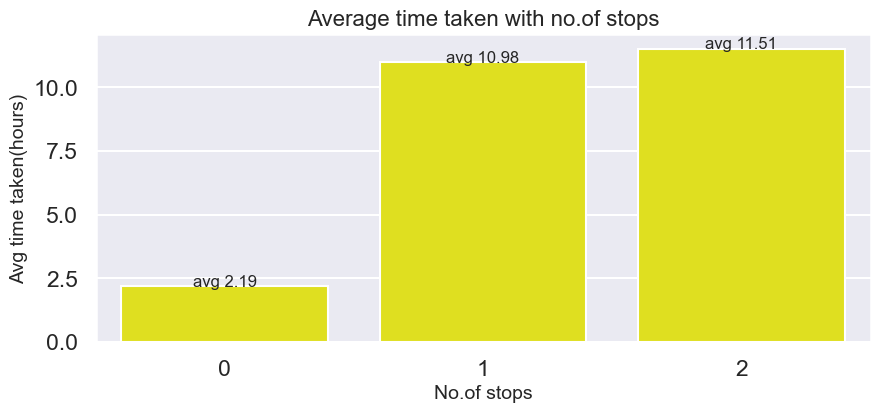

In [347]:
#time taken vs stops

# Calculate the mean time taken
mean_time = df.groupby(["stop"])["time_taken"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,4))
sns.barplot(x=mean_time.index, y=mean_time.values, color="yellow")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"avg {v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Average time taken with no.of stops", fontsize=16)
plt.xlabel("No.of stops", fontsize=14)
plt.ylabel("Avg time taken(hours)", fontsize=14)

# Show the plot
plt.show()

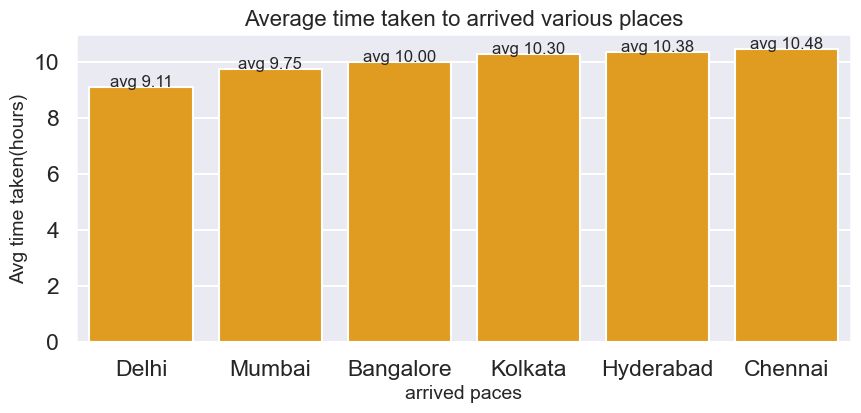

In [348]:
#time taken vs arrived places

# Calculate the mean time taken
mean_time = df.groupby(["to"])["time_taken"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,4))
sns.barplot(x=mean_time.index, y=mean_time.values, color="orange")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"avg {v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Average time taken to arrived various places", fontsize=16)
plt.xlabel("arrived paces", fontsize=14)
plt.ylabel("Avg time taken(hours)", fontsize=14)

# Show the plot
plt.show()

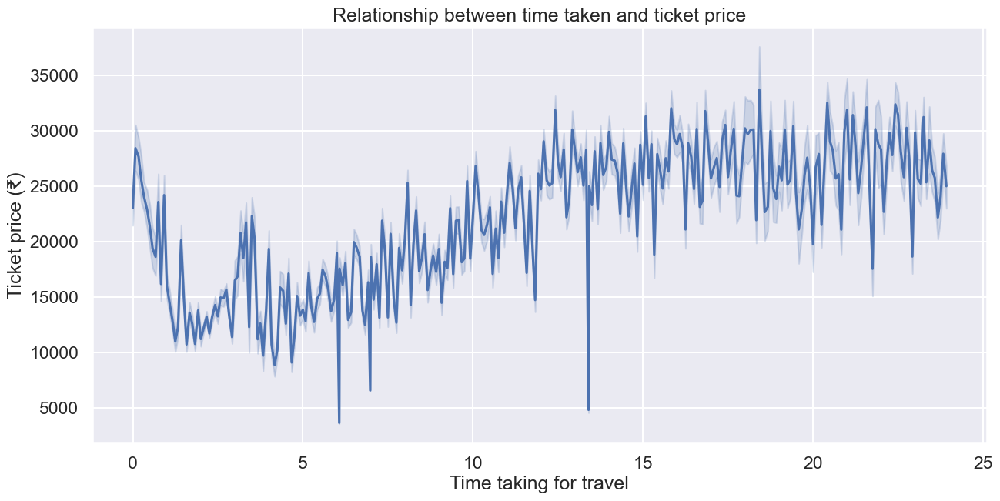

In [362]:
#time taken vs price
plt.figure(figsize=(15,7))
sns.lineplot(x=df["time_taken"],y=df["price"])
plt.title("Relationship between time taken and ticket price")
plt.xlabel("Time taking for travel")
plt.ylabel("Ticket price (₹)")
plt.show()

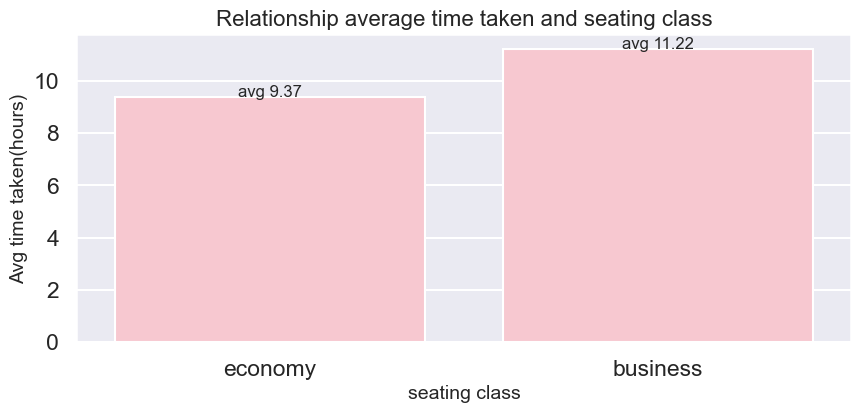

In [365]:
#time taken vs type of seating class
# Calculate the mean time taken
mean_time = df.groupby(["class"])["time_taken"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,4))
sns.barplot(x=mean_time.index, y=mean_time.values, color="pink")

# Add value labels to the bars
for i, v in enumerate(mean_time.values):
    plt.text(i, v, f"avg {v:.2f}", ha="center", fontsize=12)

# Set the title and axis labels
plt.title("Relationship average time taken and seating class", fontsize=16)
plt.xlabel("seating class", fontsize=14)
plt.ylabel("Avg time taken(hours)", fontsize=14)

# Show the plot
plt.show()

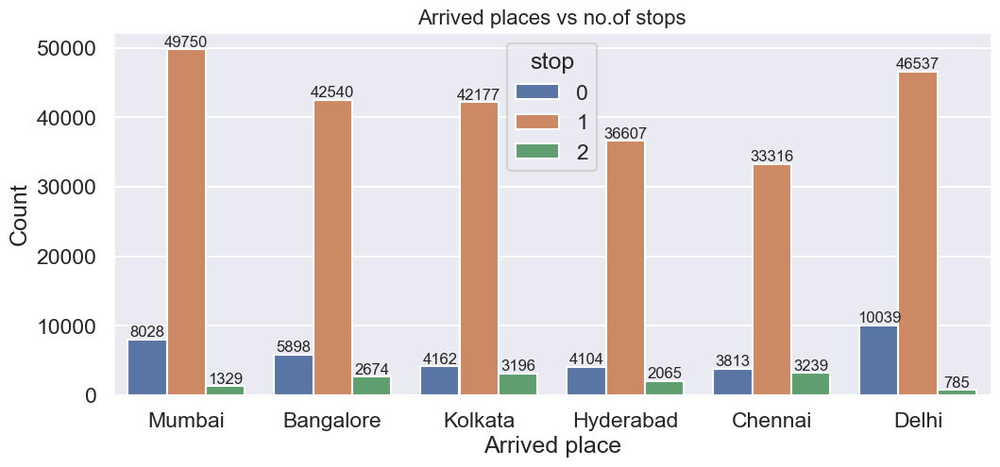

In [378]:
#arrived place vs no.of stops
plt.figure(figsize=(12,5))
ax = sns.countplot(data=df, x="to", hue="stop")

# Add count labels to the bars
for patch in ax.patches:
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f"{int(y)}", (x, y), ha="center", va="bottom", fontsize=12)

# Set the title and axis labels
plt.title("Arrived places vs no.of stops", fontsize=16)
plt.xlabel("Arrived place")
plt.ylabel("Count")

# Show the plot
plt.show()

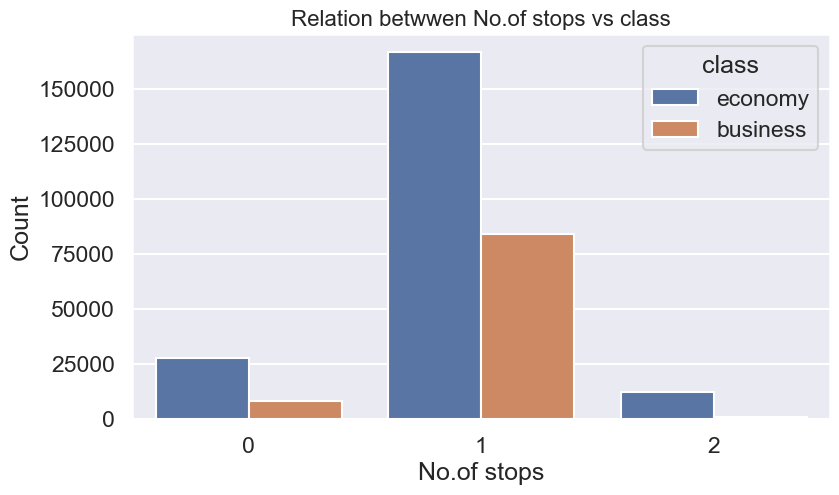

In [396]:
#No.of stops vs seating class
plt.figure(figsize=(9,5))
ax = sns.countplot(data=df, x="stop", hue="class")

# Set the title and axis labels
plt.title("Relation betwwen No.of stops vs class", fontsize=16)
plt.xlabel("No.of stops")
plt.ylabel("Count")

# Show the plot
plt.show()

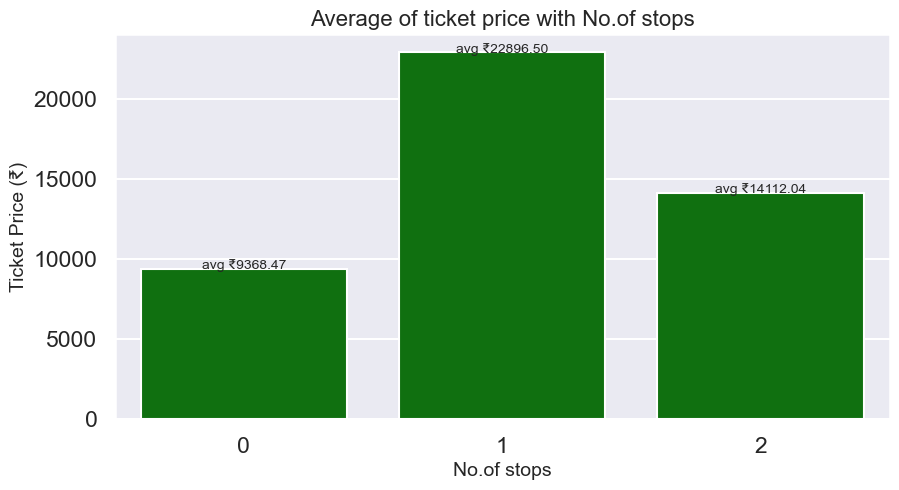

In [391]:
#No.of stops vs price
# Calculate the mean price ticket with no.of stops
mean_price = df.groupby(["stop"])["price"].mean()

# Create the bar plot
plt.figure(figsize=(10,5))
sns.barplot(x=mean_price.index, y=mean_price.values, color="green")

# Add value labels to the bars
for i, v in enumerate(mean_price.values):
    plt.text(i, v, f"avg ₹{v:.2f}",ha="center" ,fontsize=10)

# Set the title and axis labels
plt.title("Average of ticket price with No.of stops", fontsize=16)
plt.xlabel("No.of stops", fontsize=14)
plt.ylabel("Ticket Price (₹)", fontsize=14)

# Show the plot
plt.show()

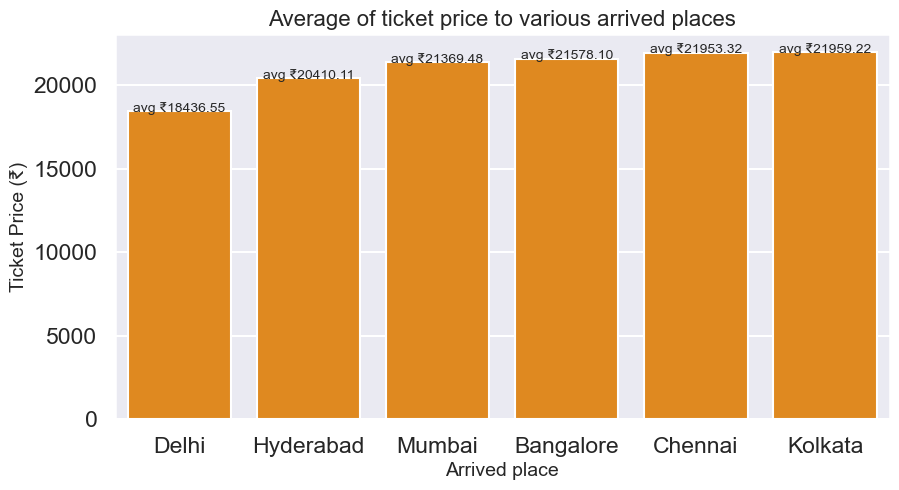

In [402]:
#arrived place vs price
# Calculate the mean price ticket with no.of stops
mean_price = df.groupby(["to"])["price"].mean().sort_values()

# Create the bar plot
plt.figure(figsize=(10,5))
sns.barplot(x=mean_price.index, y=mean_price.values, color="darkorange")

# Add value labels to the bars
for i, v in enumerate(mean_price.values):
    plt.text(i, v, f"avg ₹{v:.2f}",ha="center" ,fontsize=10)

# Set the title and axis labels
plt.title("Average of ticket price to various arrived places", fontsize=16)
plt.xlabel("Arrived place", fontsize=14)
plt.ylabel("Ticket Price (₹)", fontsize=14)

# Show the plot
plt.show()

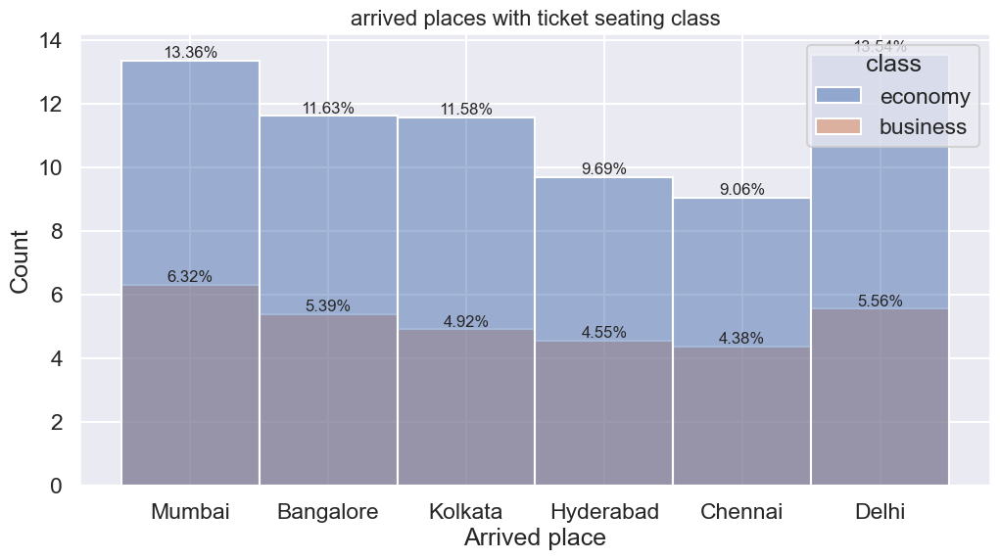

In [406]:
#arrived place vs seating class
plt.figure(figsize=(12,6))
ax = sns.histplot(data=df, x="to",stat="percent", hue="class")

# Add count labels to the bars
for patch in ax.patches:
    x = patch.get_x() + patch.get_width() / 2
    y = patch.get_height()
    ax.annotate(f"{round(y,2)}%", (x, y), ha="center", va="bottom", fontsize=12)

# Set the title and axis labels
plt.title("arrived places with ticket seating class", fontsize=16)
plt.xlabel("Arrived place")
plt.ylabel("Count")

# Show the plot
plt.show()

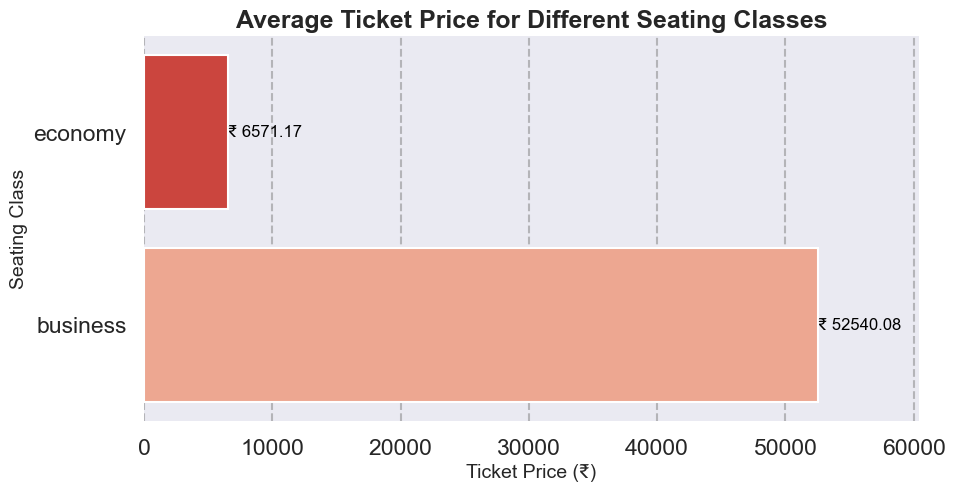

In [408]:
#ticket price vs class

# Create the bar plot
plt.figure(figsize=(10,5))
ax = sns.barplot(x=mean_price.values, y=mean_price.index, palette="Reds_r")

# Add value labels to the bars
for i, v in enumerate(mean_price.values):
    ax.text(v + 0.3, i, f"₹ {v:.2f}", color='#000000', fontsize=12, ha='left', va='center')

# Set the title and axis labels
plt.title("Average Ticket Price for Different Seating Classes", fontsize=18, fontweight='bold')
plt.xlabel("Ticket Price (₹)", fontsize=14)
plt.ylabel("Seating Class", fontsize=14)

# Remove spines and set grid
sns.despine(left=True, bottom=True)
ax.xaxis.grid(color='gray', linestyle='--', alpha=0.5)

# Set x-axis limits
ax.set_xlim([0, max(mean_price.values) * 1.15])

# Show the plot
plt.show()

## Multivariate analysis

Text(0, 0.5, 'Depature places')

C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


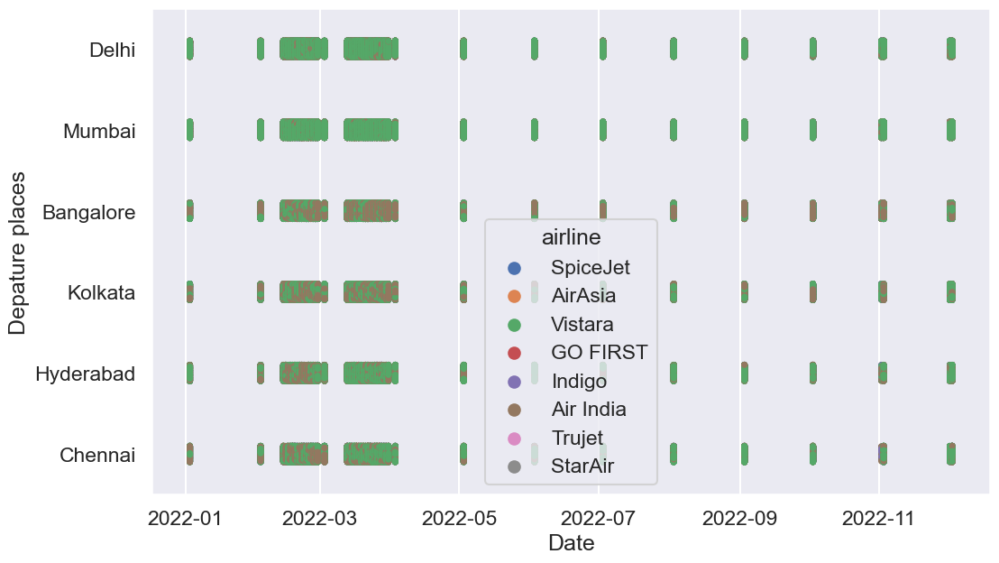

In [411]:
#date vs airline vs depature place
plt.figure(figsize=(12,7))
sns.stripplot(data=df, x="date", y="from", hue="airline", palette="deep")
plt.xlabel("Date")
plt.ylabel("Depature places")

Text(0, 0.5, 'arrived places')

C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
C:\Users\elcot\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


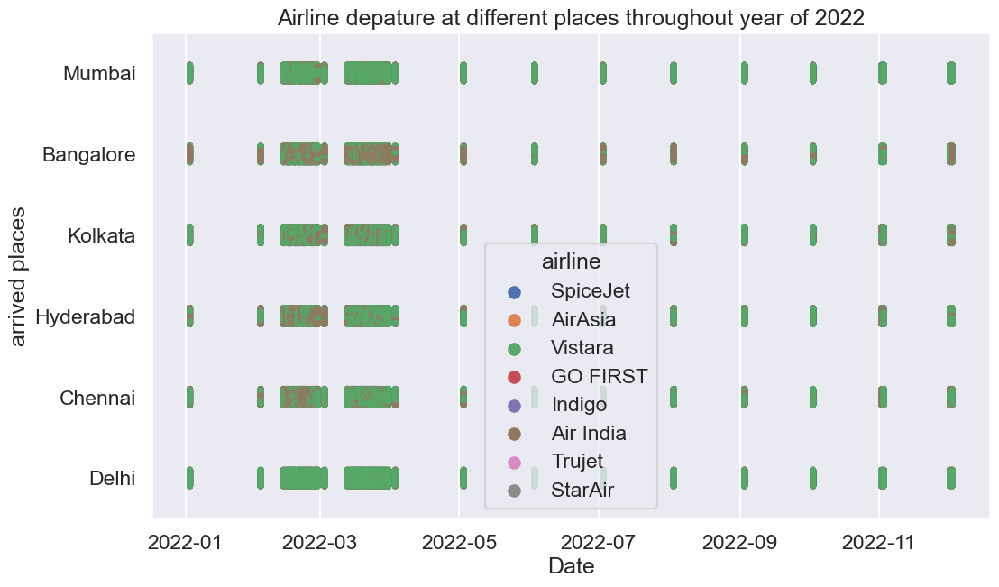

In [413]:
#date vs airline vs arrival place
plt.figure(figsize=(12,7))
sns.stripplot(data=df, x="date", y="to", hue="airline", palette="deep")
plt.title("Airline depature at different places throughout year of 2022")
plt.xlabel("Date")
plt.ylabel("arrived places")

Text(0, 0.5, 'Time taking (hours)')

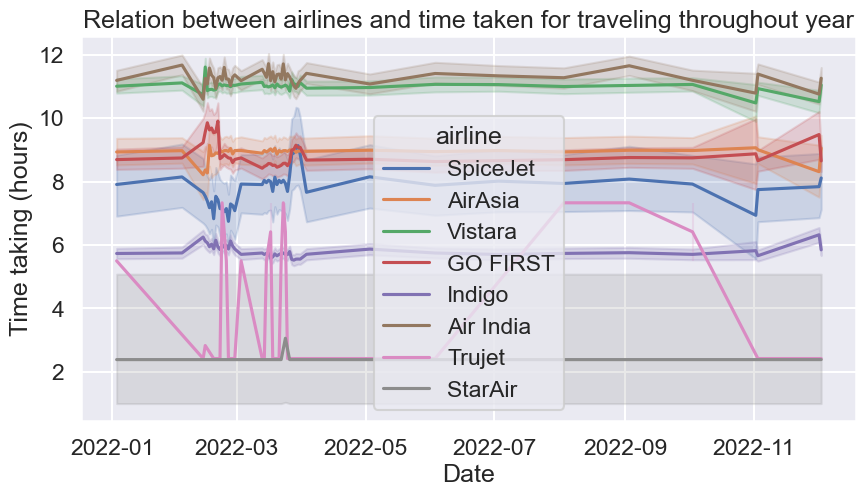

In [414]:
#date vs airline vs time taking of travel
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="date", y="time_taken", hue="airline")
plt.title("Relation between airlines and time taken for traveling throughout year")
plt.xlabel("Date")
plt.ylabel("Time taking (hours)")

Text(0, 0.5, 'No.of stops')

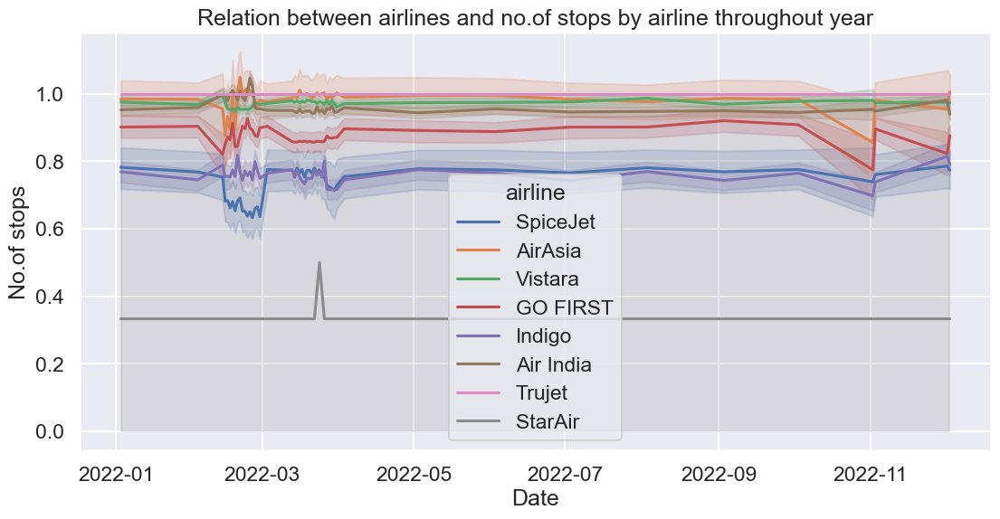

In [417]:
#date vs airline vs no.of stops
plt.figure(figsize=(13,6))
sns.lineplot(data=df, x="date", y="stop", hue="airline")
plt.title("Relation between airlines and no.of stops by airline throughout year")
plt.xlabel("Date")
plt.ylabel("No.of stops")

Text(0, 0.5, 'Tiket fare')

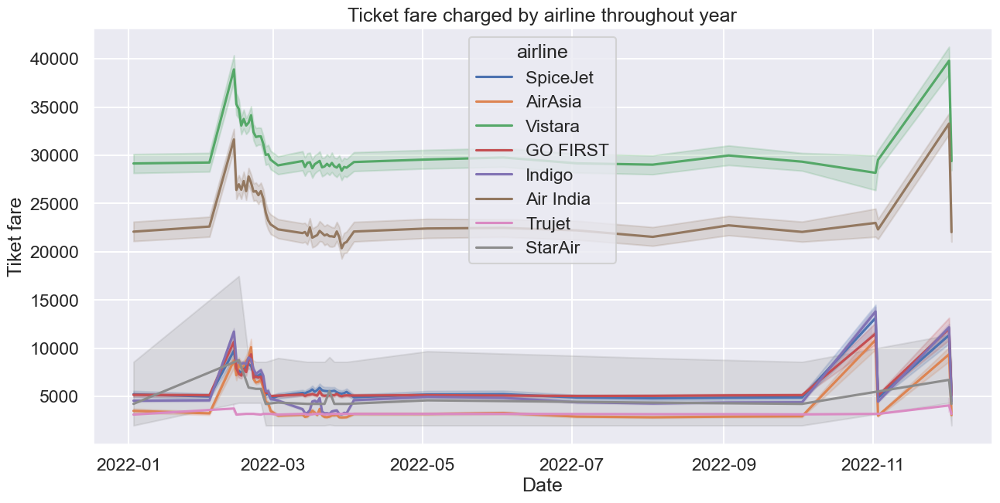

In [418]:
#date vs airline vs price
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x="date", y="price", hue="airline")
plt.title("Ticket fare charged by airline throughout year")
plt.xlabel("Date")
plt.ylabel("Tiket fare")

Text(0, 0.5, 'Time taking (hours)')

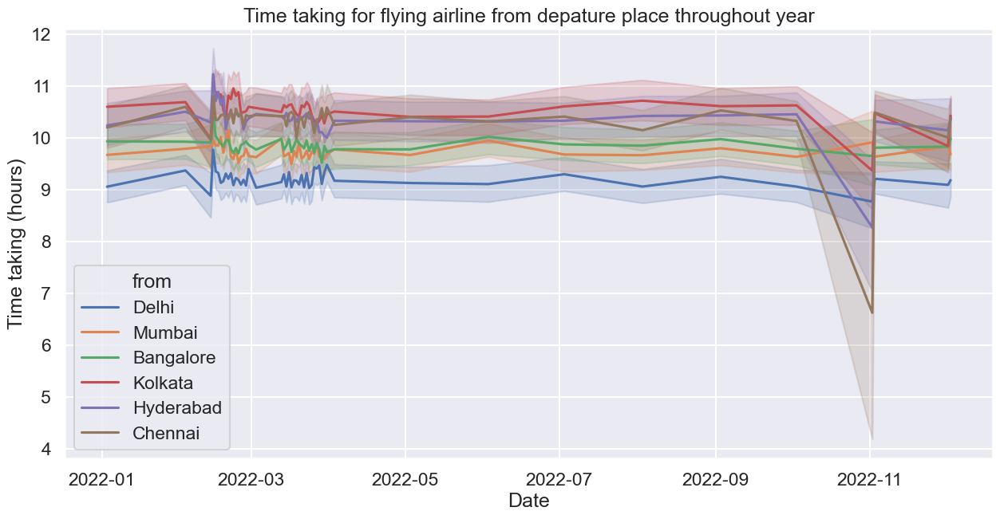

In [420]:
#date vs time taken vs depature place
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x="date", y="time_taken", hue="from")
plt.title("Time taking for flying airline from depature place throughout year")
plt.xlabel("Date")
plt.ylabel("Time taking (hours)")

Text(0, 0.5, 'Ticket price(₹)')

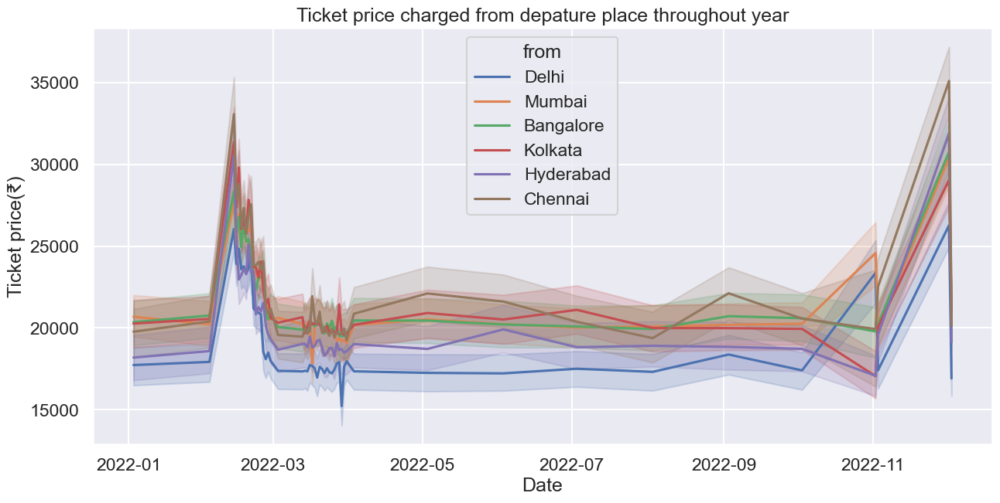

In [421]:
#date vs Ticket fare vs depature place
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x="date", y="price", hue="from")
plt.title("Ticket price charged from depature place throughout year")
plt.xlabel("Date")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Time taking (hours)')

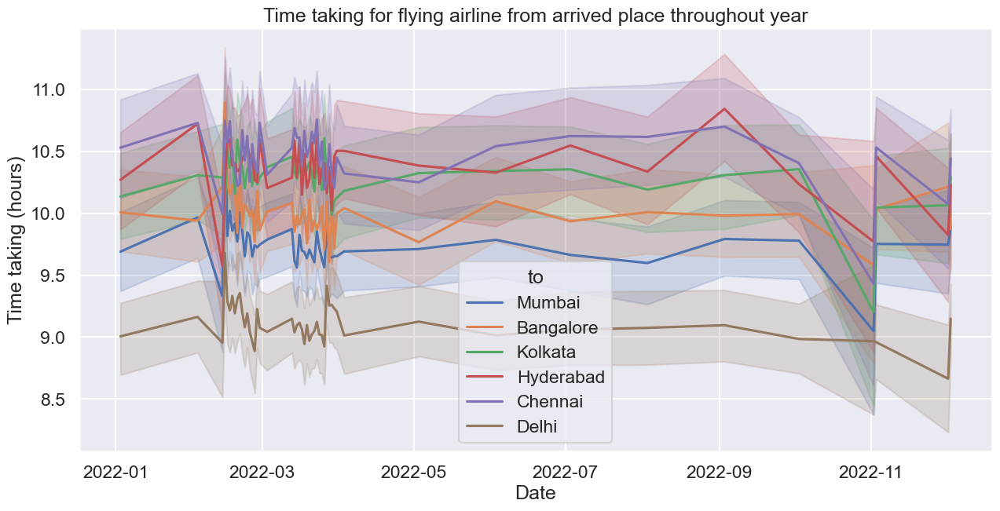

In [422]:
#date vs time taken vs arrived place
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x="date", y="time_taken", hue="to")
plt.title("Time taking for flying airline to arrived place throughout year")
plt.xlabel("Date")
plt.ylabel("Time taking (hours)")

Text(0, 0.5, 'Ticket price(₹)')

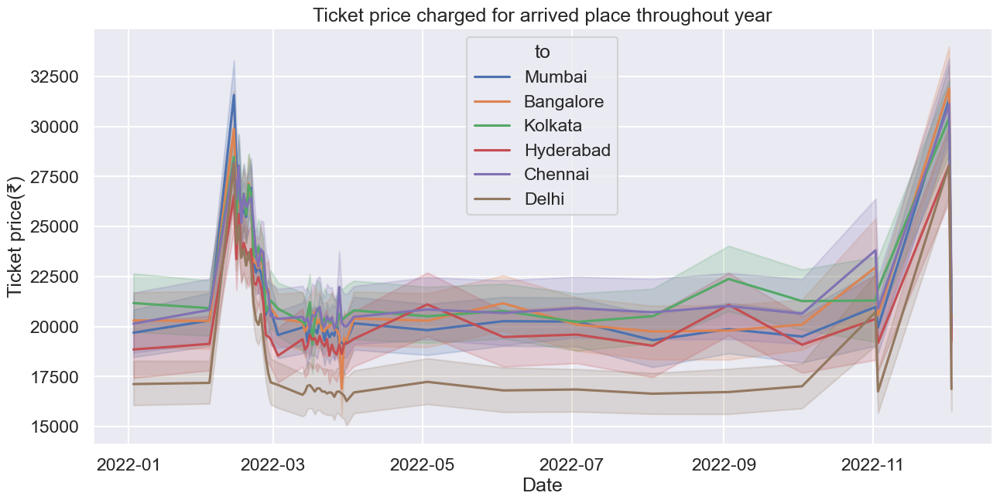

In [423]:
#date vs Ticket fare vs arrived place
plt.figure(figsize=(15,7))
sns.lineplot(data=df, x="date", y="price", hue="to")
plt.title("Ticket price charged for arrived place throughout year")
plt.xlabel("Date")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Time taken(hours)')

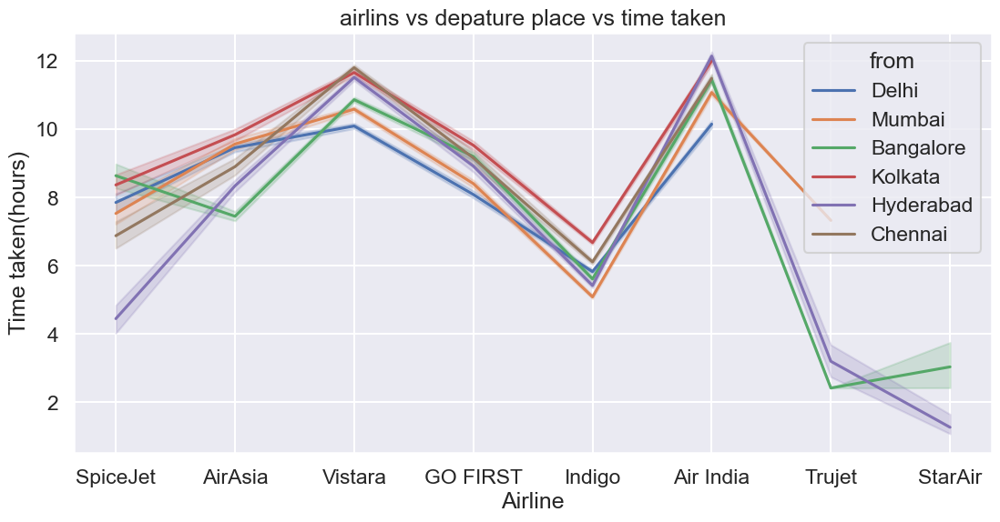

In [430]:
#airline vs depature place vs time taken
plt.figure(figsize=(13,6))
sns.lineplot(data=df, x="airline",y="time_taken", hue="from")
plt.title("airlins vs depature place vs time taken")
plt.xlabel("Airline")
plt.ylabel("Time taken(hours)")

Text(0, 0.5, 'Ticket price(₹)')

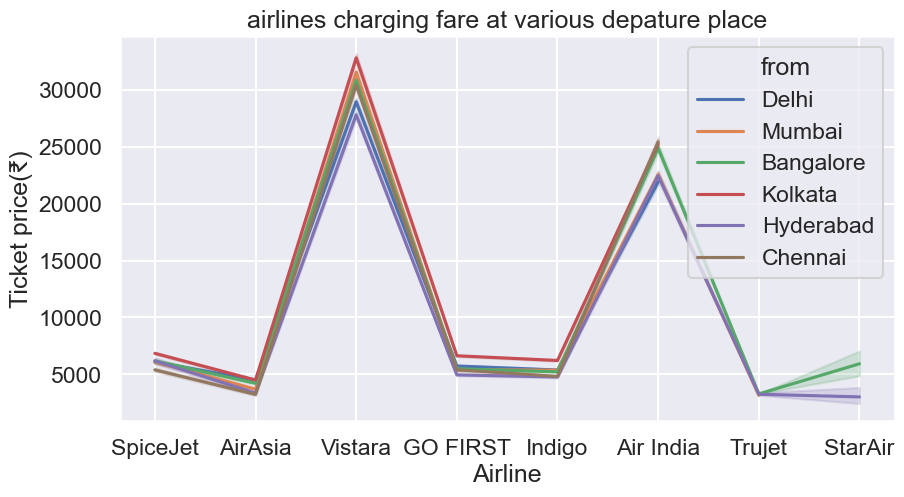

In [432]:
#airline vs depature place vs Ticket fare
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="airline",y="price", hue="from")
plt.title("airlines charging fare at various depature place")
plt.xlabel("Airline")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Time taken(hours)')

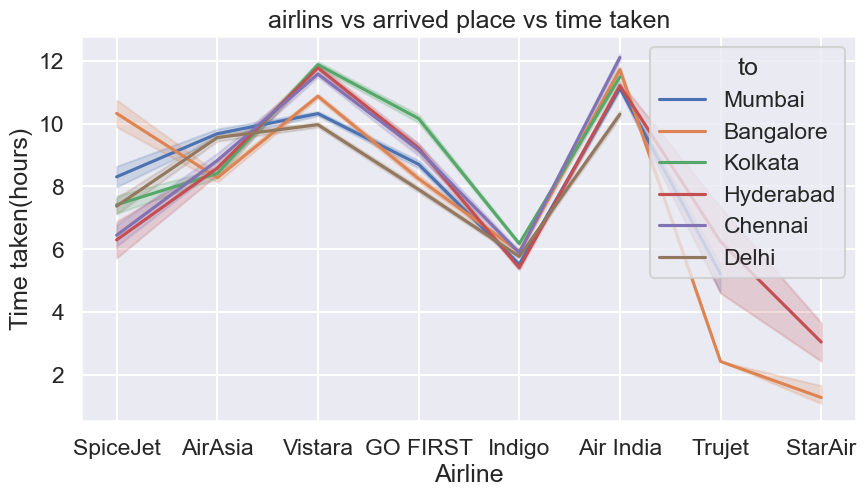

In [433]:
#airline vs arrived place vs time taken
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="airline",y="time_taken", hue="to")
plt.title("airlins vs arrived place vs time taken")
plt.xlabel("Airline")
plt.ylabel("Time taken(hours)")

Text(0, 0.5, 'Ticket price(₹)')

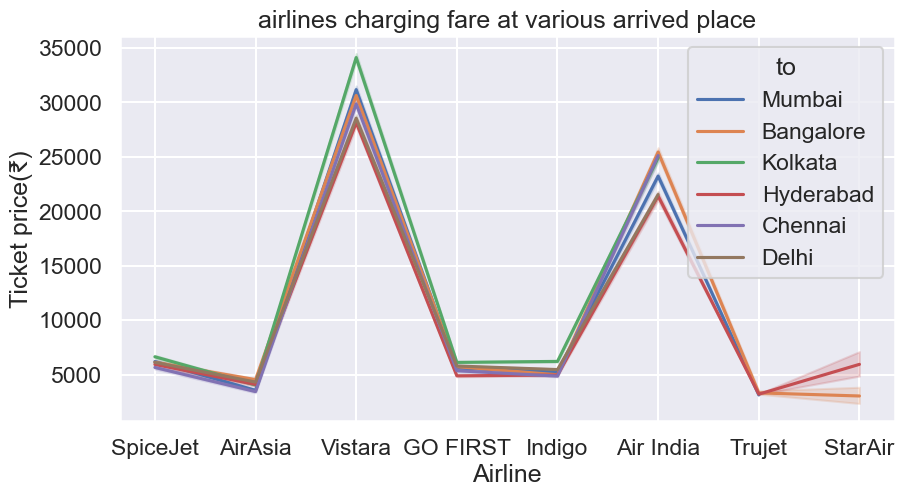

In [434]:
#airline vs arrived place vs Ticket fare
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="airline",y="price", hue="to")
plt.title("airlines charging fare at various arrived place")
plt.xlabel("Airline")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Ticket price(₹)')

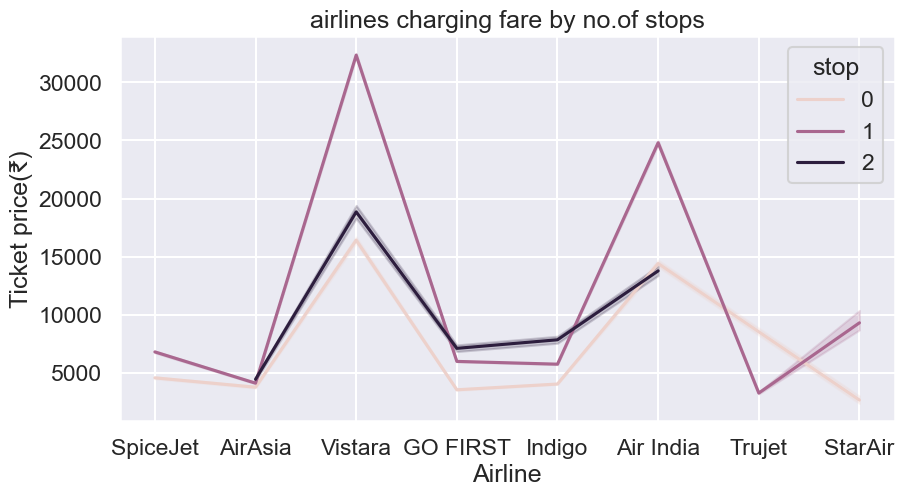

In [435]:
#airline vs stop vs price
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="airline",y="price", hue="stop")
plt.title("airlines charging fare by no.of stops")
plt.xlabel("Airline")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Time taking (hours)')

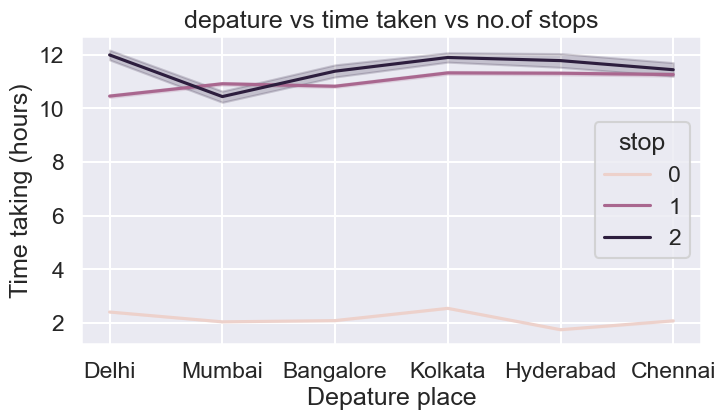

In [437]:
#depature vs time_taken vs stop
plt.figure(figsize=(8,4))
sns.lineplot(data=df, x="from",y="time_taken", hue="stop")
plt.title("depature vs time taken vs no.of stops")
plt.xlabel("Depature place")
plt.ylabel("Time taking (hours)")

Text(0, 0.5, 'Time taking (hours)')

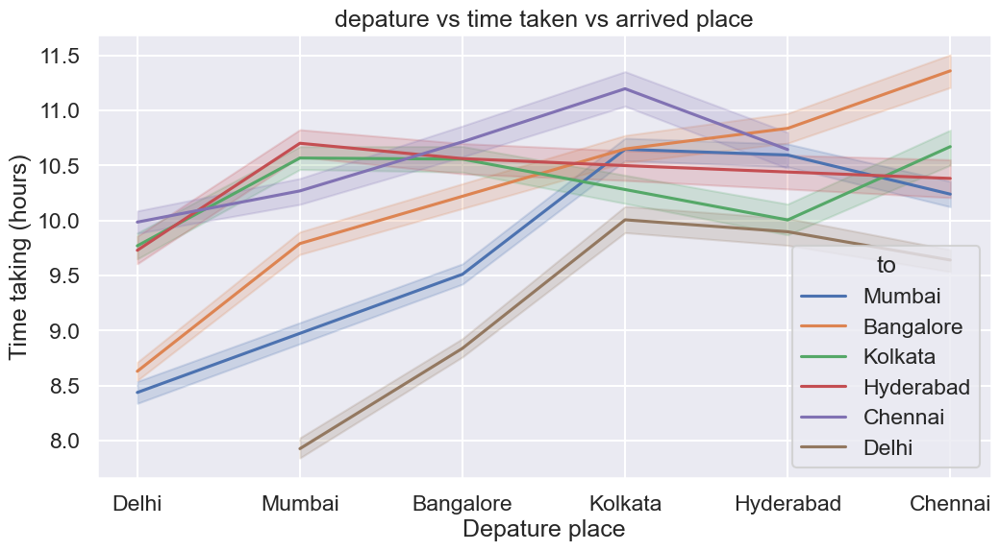

In [439]:
#depature vs time_taken vs Arrived place
plt.figure(figsize=(12,6))
sns.lineplot(data=df, x="from",y="time_taken", hue="to")
plt.title("depature vs time taken vs arrived place")
plt.xlabel("Depature place")
plt.ylabel("Time taking (hours)")

Text(0.5, 0, 'Time taking (hours)')

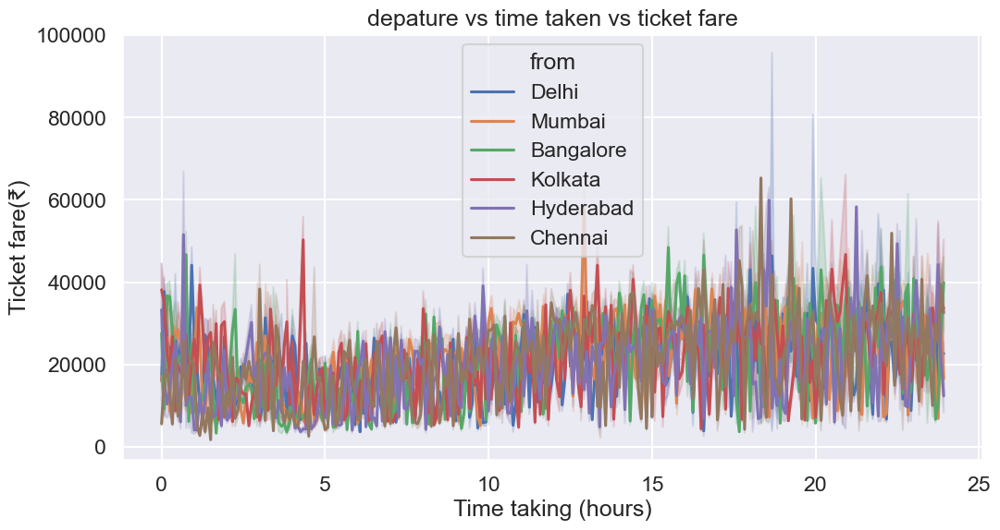

In [441]:
#depature vs time_taken vs price
plt.figure(figsize=(12,6))
sns.lineplot(data=df, hue="from",x="time_taken", y="price")
plt.title("depature vs time taken vs ticket fare")
plt.ylabel("Ticket fare(₹)")
plt.xlabel("Time taking (hours)")

Text(0, 0.5, 'Ticket price(₹)')

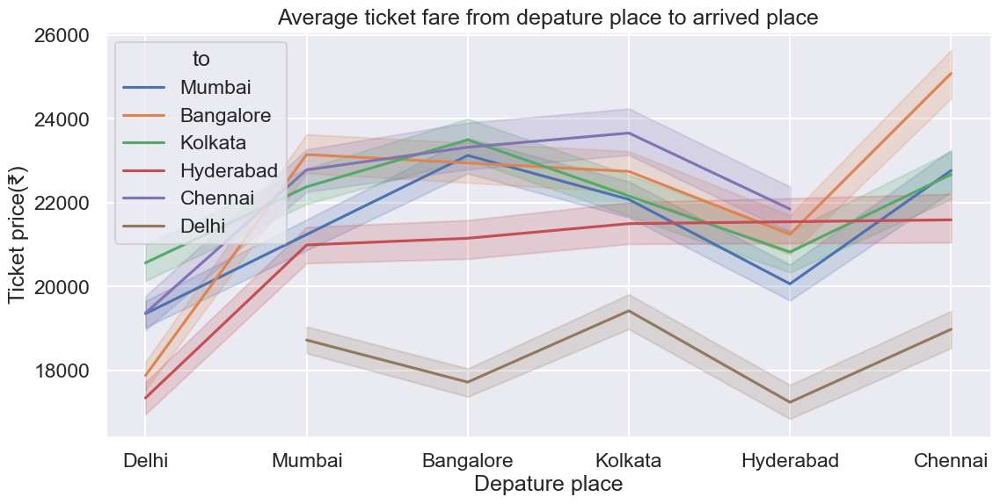

In [448]:
#depature place vs arrived place vs price
plt.figure(figsize=(13,6))
sns.lineplot(data=df, x="from",y="price", hue="to")
plt.title("Average ticket fare from depature place to arrived place")
plt.xlabel("Depature place")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Ticket price(₹)')

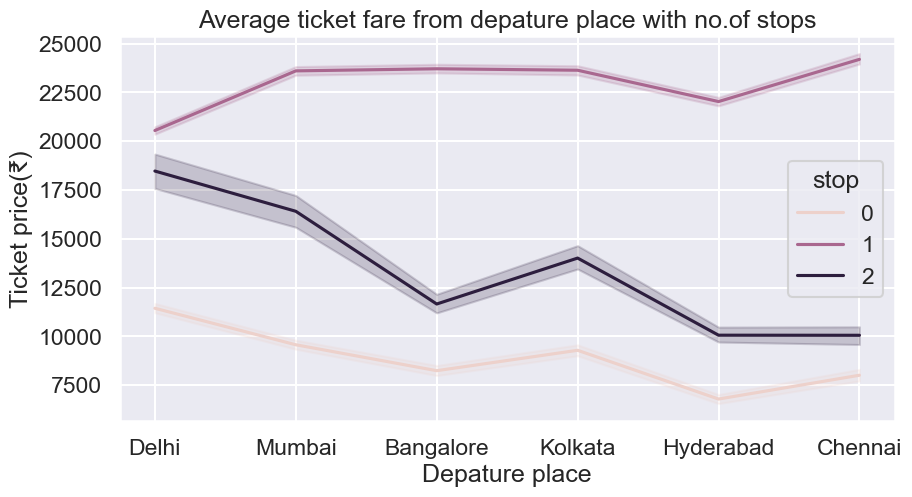

In [444]:
#depature place vs no.of stops vs price
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="from",y="price", hue="stop")
plt.title("Average ticket fare from depature place with no.of stops")
plt.xlabel("Depature place")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Ticket price(₹)')

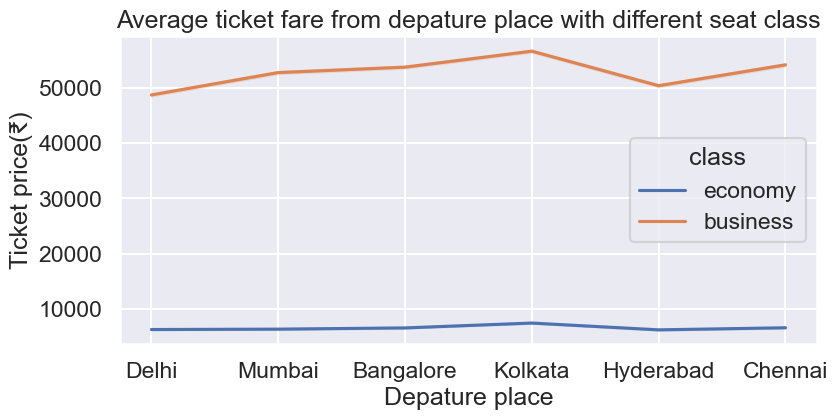

In [451]:
#depature place vs seat class vs price
plt.figure(figsize=(9,4))
sns.lineplot(data=df, x="from",y="price", hue="class")
plt.title("Average ticket fare from depature place with different seat class")
plt.xlabel("Depature place")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Ticket price(₹)')

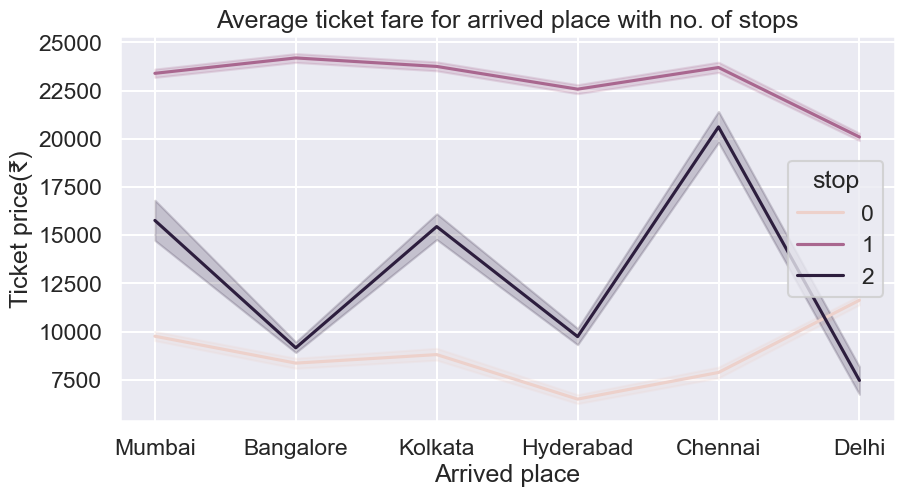

In [446]:
#arrived place vs no.of stops vs price
plt.figure(figsize=(10,5))
sns.lineplot(data=df, x="to",y="price", hue="stop")
plt.title("Average ticket fare for arrived place with no. of stops")
plt.xlabel("Arrived place")
plt.ylabel("Ticket price(₹)")

Text(0, 0.5, 'Ticket price(₹)')

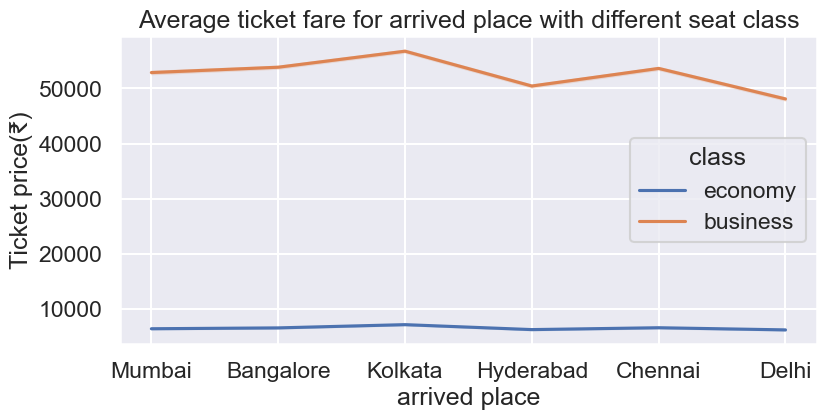

In [449]:
#arrived place vs seat class vs price
plt.figure(figsize=(9,4))
sns.lineplot(data=df, x="to",y="price", hue="class")
plt.title("Average ticket fare for arrived place with different seat class")
plt.xlabel("arrived place")
plt.ylabel("Ticket price(₹)")

## Feature Engineering

In [39]:
df.head()

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code
0,2022-11-02,SpiceJet,18:55:00,Delhi,2.17,0,21:05:00,Mumbai,5953,economy,SG-8709
1,2022-11-02,SpiceJet,06:20:00,Delhi,2.33,0,08:40:00,Mumbai,5953,economy,SG-8157
2,2022-11-02,AirAsia,04:25:00,Delhi,2.17,0,06:35:00,Mumbai,5956,economy,I5-764
3,2022-11-02,Vistara,10:20:00,Delhi,2.25,0,12:35:00,Mumbai,5955,economy,UK-995
4,2022-11-02,Vistara,08:50:00,Delhi,2.33,0,11:10:00,Mumbai,5955,economy,UK-963


In [40]:
df["journey_day"]=pd.to_datetime(df['date']).dt.day
df["journey_month"]=pd.to_datetime(df['date']).dt.month

In [41]:
df["dep_time"]=df["dep_time"].apply(lambda x:str(x))
df[["dep_hour","dep_minute","dep_second"]]=df["dep_time"].str.split(':',expand=True)

In [42]:
df=df.drop(columns=["dep_second"],axis=1)
df.head()

,date,airline,dep_time,from,time_taken,stop,arr_time,to,price,class,fli_code,journey_day,journey_month,dep_hour,dep_minute
0,2022-11-02,SpiceJet,18:55:00,Delhi,2.17,0,21:05:00,Mumbai,5953,economy,SG-8709,2,11,18,55
1,2022-11-02,SpiceJet,06:20:00,Delhi,2.33,0,08:40:00,Mumbai,5953,economy,SG-8157,2,11,06,20
2,2022-11-02,AirAsia,04:25:00,Delhi,2.17,0,06:35:00,Mumbai,5956,economy,I5-764,2,11,04,25
3,2022-11-02,Vistara,10:20:00,Delhi,2.25,0,12:35:00,Mumbai,5955,economy,UK-995,2,11,10,20
4,2022-11-02,Vistara,08:50:00,Delhi,2.33,0,11:10:00,Mumbai,5955,economy,UK-963,2,11,08,50


In [43]:
df=df.rename(columns={"from":"source","to":"destination","time_taken":"duration"})

In [44]:
df["arr_time"]=df["arr_time"].apply(lambda x:str(x))
df[["arr_hour","arr_minute","arr_second"]]=df["arr_time"].str.split(':',expand=True)
df=df.drop(columns=["arr_second"],axis=1)
df.head()

,date,airline,dep_time,source,duration,stop,arr_time,destination,price,class,fli_code,journey_day,journey_month,dep_hour,dep_minute,arr_hour,arr_minute
0,2022-11-02,SpiceJet,18:55:00,Delhi,2.17,0,21:05:00,Mumbai,5953,economy,SG-8709,2,11,18,55,21,05
1,2022-11-02,SpiceJet,06:20:00,Delhi,2.33,0,08:40:00,Mumbai,5953,economy,SG-8157,2,11,06,20,08,40
2,2022-11-02,AirAsia,04:25:00,Delhi,2.17,0,06:35:00,Mumbai,5956,economy,I5-764,2,11,04,25,06,35
3,2022-11-02,Vistara,10:20:00,Delhi,2.25,0,12:35:00,Mumbai,5955,economy,UK-995,2,11,10,20,12,35
4,2022-11-02,Vistara,08:50:00,Delhi,2.33,0,11:10:00,Mumbai,5955,economy,UK-963,2,11,08,50,11,10


In [45]:
df=df.drop(columns=["date","dep_time","arr_time","fli_code"],axis=1)
df

,airline,source,duration,stop,destination,price,class,journey_day,journey_month,dep_hour,dep_minute,arr_hour,arr_minute
0,SpiceJet,Delhi,2.17,0,Mumbai,5953,economy,2,11,18,55,21,05
1,SpiceJet,Delhi,2.33,0,Mumbai,5953,economy,2,11,06,20,08,40
2,AirAsia,Delhi,2.17,0,Mumbai,5956,economy,2,11,04,25,06,35
3,Vistara,Delhi,2.25,0,Mumbai,5955,economy,2,11,10,20,12,35
4,Vistara,Delhi,2.33,0,Mumbai,5955,economy,2,11,08,50,11,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
300256,Vistara,Chennai,10.08,1,Hyderabad,69265,business,31,3,09,45,19,50
300257,Vistara,Chennai,10.42,1,Hyderabad,77105,business,31,3,12,30,22,55
300258,Vistara,Chennai,13.83,1,Hyderabad,79099,business,31,3,07,05,20,55
300259,Vistara,Chennai,10.00,1,Hyderabad,81585,business,31,3,07,00,17,00


In [46]:
col=['stop', 'price', 'journey_day', 'journey_month', 'dep_hour', 'dep_minute','arr_hour', 'arr_minute']
for i in col:
    df[i]=df[i].apply(lambda x:int(x))

In [47]:
source=df[["source"]]
source=pd.get_dummies(source,drop_first=True)
source.head()

,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai
0,0,1,0,0,0
1,0,1,0,0,0
2,0,1,0,0,0
3,0,1,0,0,0
4,0,1,0,0,0


In [48]:
airline=df[["airline"]]
airline=pd.get_dummies(airline,drop_first=True)
airline.head()

,airline_AirAsia,airline_GO FIRST,airline_Indigo,airline_SpiceJet,airline_StarAir,airline_Trujet,airline_Vistara
0,0,0,0,1,0,0,0
1,0,0,0,1,0,0,0
2,1,0,0,0,0,0,0
3,0,0,0,0,0,0,1
4,0,0,0,0,0,0,1


In [49]:
destination=df[["destination"]]
destination=pd.get_dummies(destination,drop_first=True)
destination.head()

,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,0,0,0,0,1
1,0,0,0,0,1
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,0,1


In [50]:
df.replace({"economy":0,"business":1},inplace=True)
df.head()

,airline,source,duration,stop,destination,price,class,journey_day,journey_month,dep_hour,dep_minute,arr_hour,arr_minute
0,SpiceJet,Delhi,2.17,0,Mumbai,5953,0,2,11,18,55,21,5
1,SpiceJet,Delhi,2.33,0,Mumbai,5953,0,2,11,6,20,8,40
2,AirAsia,Delhi,2.17,0,Mumbai,5956,0,2,11,4,25,6,35
3,Vistara,Delhi,2.25,0,Mumbai,5955,0,2,11,10,20,12,35
4,Vistara,Delhi,2.33,0,Mumbai,5955,0,2,11,8,50,11,10


In [51]:
df=pd.concat([df,airline,source,destination],axis=1)
df.head()

,airline,source,duration,stop,destination,price,class,journey_day,journey_month,dep_hour,...,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,SpiceJet,Delhi,2.17,0,Mumbai,5953,0,2,11,18,...,0,1,0,0,0,0,0,0,0,1
1,SpiceJet,Delhi,2.33,0,Mumbai,5953,0,2,11,6,...,0,1,0,0,0,0,0,0,0,1
2,AirAsia,Delhi,2.17,0,Mumbai,5956,0,2,11,4,...,0,1,0,0,0,0,0,0,0,1
3,Vistara,Delhi,2.25,0,Mumbai,5955,0,2,11,10,...,0,1,0,0,0,0,0,0,0,1
4,Vistara,Delhi,2.33,0,Mumbai,5955,0,2,11,8,...,0,1,0,0,0,0,0,0,0,1


In [52]:
df=df.drop(columns=["airline","source","destination"],axis=1)

In [53]:
df.head()

,duration,stop,price,class,journey_day,journey_month,dep_hour,dep_minute,arr_hour,arr_minute,...,source_Chennai,source_Delhi,source_Hyderabad,source_Kolkata,source_Mumbai,destination_Chennai,destination_Delhi,destination_Hyderabad,destination_Kolkata,destination_Mumbai
0,2.17,0,5953,0,2,11,18,55,21,5,...,0,1,0,0,0,0,0,0,0,1
1,2.33,0,5953,0,2,11,6,20,8,40,...,0,1,0,0,0,0,0,0,0,1
2,2.17,0,5956,0,2,11,4,25,6,35,...,0,1,0,0,0,0,0,0,0,1
3,2.25,0,5955,0,2,11,10,20,12,35,...,0,1,0,0,0,0,0,0,0,1
4,2.33,0,5955,0,2,11,8,50,11,10,...,0,1,0,0,0,0,0,0,0,1


In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 300259 entries, 0 to 300260
Data columns (total 27 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   duration               300259 non-null  float64
 1   stop                   300259 non-null  int64  
 2   price                  300259 non-null  int64  
 3   class                  300259 non-null  int64  
 4   journey_day            300259 non-null  int64  
 5   journey_month          300259 non-null  int64  
 6   dep_hour               300259 non-null  int64  
 7   dep_minute             300259 non-null  int64  
 8   arr_hour               300259 non-null  int64  
 9   arr_minute             300259 non-null  int64  
 10  airline_AirAsia        300259 non-null  uint8  
 11  airline_GO FIRST       300259 non-null  uint8  
 12  airline_Indigo         300259 non-null  uint8  
 13  airline_SpiceJet       300259 non-null  uint8  
 14  airline_StarAir        300259 non-nu

# Feature selection

### 1.correlation & heat map

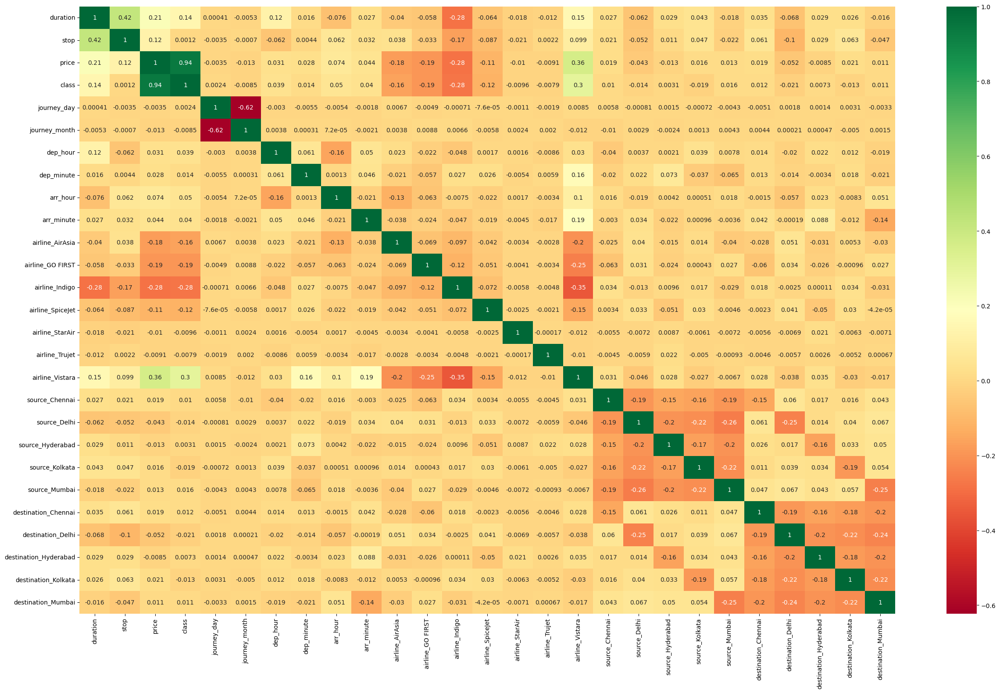

In [60]:
plt.figure(figsize=(30,18))
sns.heatmap(df.corr(),annot=True,cmap='RdYlGn')

plt.show()

### 2.Extra tree regressor

In [56]:
x=df.loc[:,['duration', 'stop', 'class', 'journey_day', 'journey_month',
       'dep_hour', 'dep_minute', 'arr_hour', 'arr_minute', 'airline_AirAsia',
       'airline_GO FIRST', 'airline_Indigo', 'airline_SpiceJet',
       'airline_StarAir', 'airline_Trujet', 'airline_Vistara',
       'source_Chennai', 'source_Delhi', 'source_Hyderabad', 'source_Kolkata',
       'source_Mumbai', 'destination_Chennai', 'destination_Delhi',
       'destination_Hyderabad', 'destination_Kolkata', 'destination_Mumbai']]
y=df.iloc[:,2]

In [57]:
from sklearn.ensemble import ExtraTreesRegressor
selection= ExtraTreesRegressor()
selection.fit(x,y)

ExtraTreesRegressor()

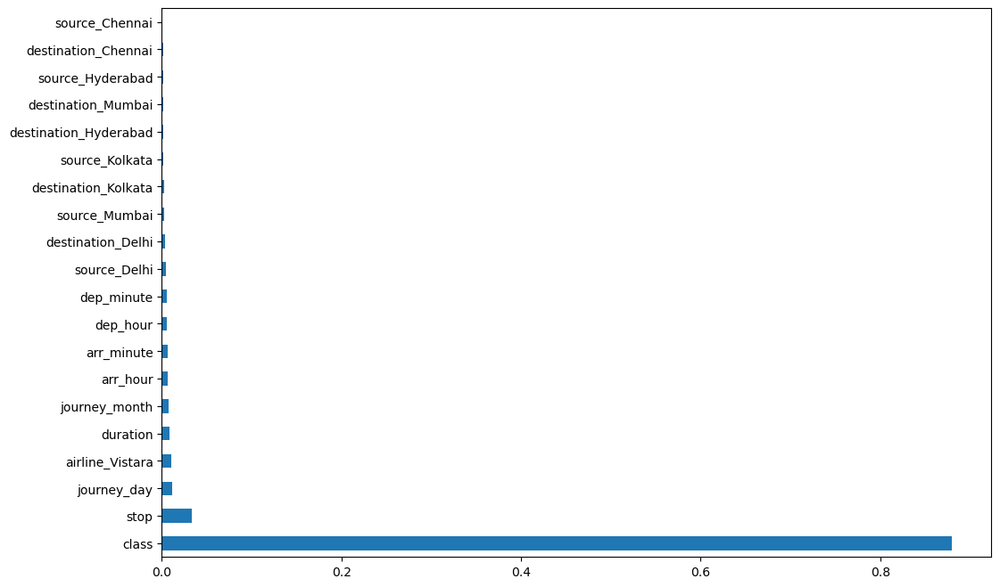

In [58]:
#plotting a graph of feature importances for better visualization
plt.figure(figsize=(12,8))
fe_importances=pd.Series(selection.feature_importances_,index=x.columns)
fe_importances.nlargest(20).plot(kind="barh")
plt.show()

### 3.mutual_info_regression

<Axes: >

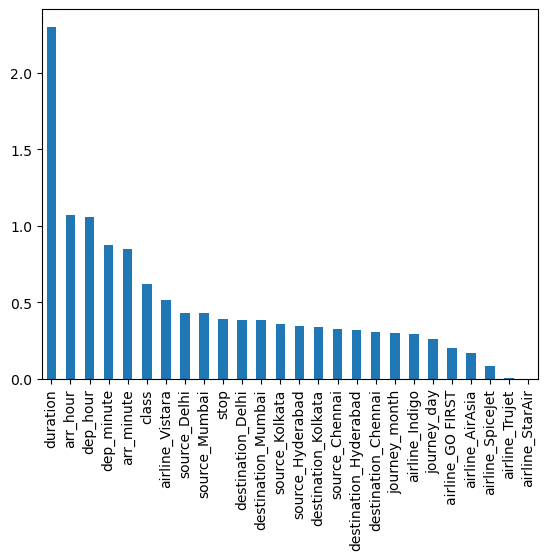

In [59]:
#feature selection - information gain - mutual_info_regression

from sklearn.feature_selection import mutual_info_regression

mutual_info=mutual_info_regression(x,y)
mutual_info=pd.Series(mutual_info)
mutual_info.index=x.columns
mutual_info.sort_values(ascending=False).plot.bar()

# Modeling
## 1.Linear regression

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score,accuracy_score

x=df.drop(columns=["price"],axis=1)
y=df["price"]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

print(x_train.shape, x_test.shape,y_train.shape)

(210181, 26) (90078, 26) (210181,)


Mean Squared Error (MSE): 49211374.0042409
Root Mean Squared Error (RMSE): 7015.08189576151
Mean Absolute Error (MAE): 4783.680440266121
R-squared (R²): 0.9044931693673741


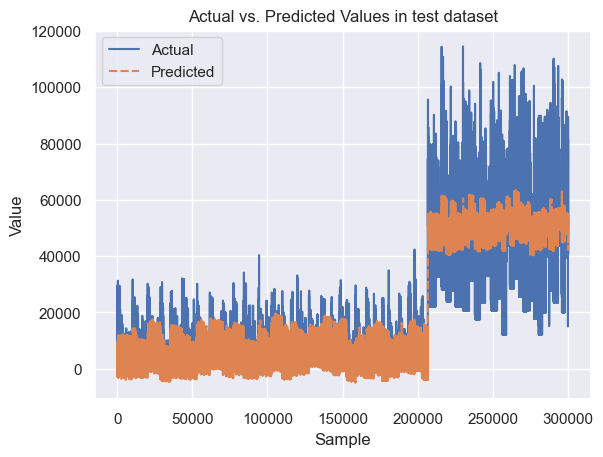

In [62]:
# Define Linear regressor model
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()

# Train the model
lr_model.fit(x_train, y_train)

# Predict on test set
y_pred = lr_model.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R²):", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

Mean Squared Error (MSE) for train dataset: 49388800.73362314
Root Mean Squared Error (RMSE) for train data set: 7027.716608801406
Mean Absolute Error (MAE) for train dataset: 4796.089363654533
R-squared (R²) for train dataset: 0.9041061439625891


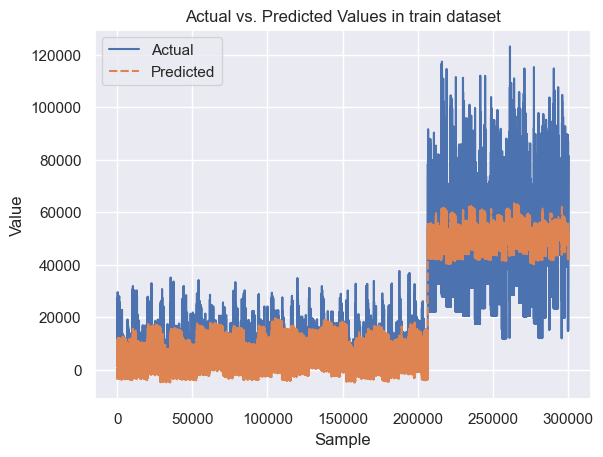

In [63]:
# Predict on test set
y_pred = lr_model.predict(x_train)

# Evaluate the model
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_train, y_pred)
r2 = r2_score(y_train, y_pred)

print("Mean Squared Error (MSE) for train dataset:", mse)
print("Root Mean Squared Error (RMSE) for train data set:", rmse)
print("Mean Absolute Error (MAE) for train dataset:", mae)
print("R-squared (R²) for train dataset:", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

### 2.Decision tree regressor

In [63]:
from sklearn.tree import DecisionTreeRegressor

# Fitting the decision tree
model_dtr = DecisionTreeRegressor()
model_dtr.fit(x_train, y_train)

DecisionTreeRegressor()

In [64]:
#model evaluate
# Make predictions on the test set
y_pred = model_dtr.predict(x_test)

# Calculate the evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R²):", r2)


Mean Squared Error (MSE): 10115749.13733283
Root Mean Squared Error (RMSE): 3180.526550326664
Mean Absolute Error (MAE): 1017.3664564784593
R-squared (R²): 0.980367889352203


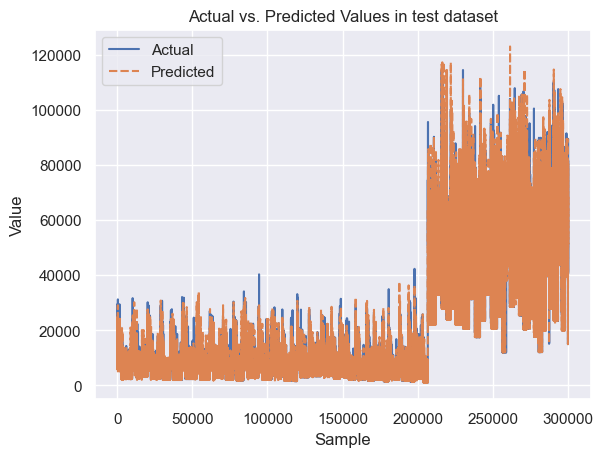

In [65]:
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


In [66]:
# Make predictions on the train set
y_pred = model_dtr.predict(x_train)

# Calculate the evaluation metrics
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_train, y_pred)
r2 = r2_score(y_train, y_pred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R²):", r2)

Mean Squared Error (MSE): 95061.25734882474
Root Mean Squared Error (RMSE): 308.32005667621553
Mean Absolute Error (MAE): 17.25070772334321
R-squared (R²): 0.9998154279838437


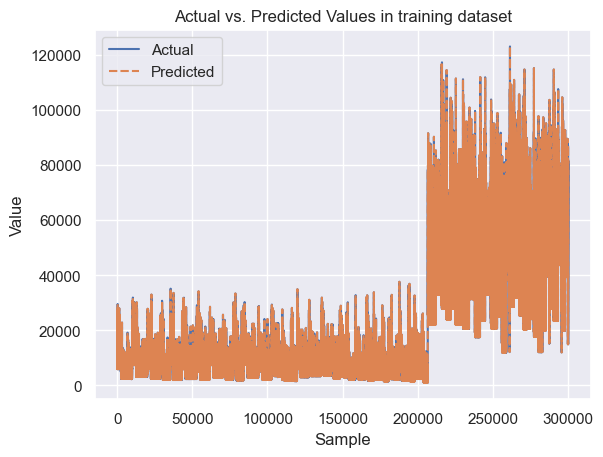

In [67]:
#for train dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in training dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


In [68]:
#hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Define the model
model_dtr = DecisionTreeRegressor(random_state=42)

# Define the hyperparameters to tune
param_grid = {'max_depth': [1,2,3,4,5,6],
              'min_samples_split': [2, 5, 10, 15, 20, 25],
              'min_samples_leaf': [1, 2, 5, 7,9,10]}

# Define the grid search object
grid_search = GridSearchCV(estimator=model_dtr, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search object to the data
grid_search.fit(x_train, y_train)

# Print the best parameters found
print(grid_search.best_params_)

{'max_depth': 6, 'min_samples_leaf': 2, 'min_samples_split': 10}


For Test data
----------------------------------------------------------
Mean Squared Error (MSE): 29628770.29302216
Root Mean Squared Error (RMSE): 5443.231603838124
Mean Absolute Error (MAE): 3159.4397216444045
R-squared (R²): 0.9424980504306832


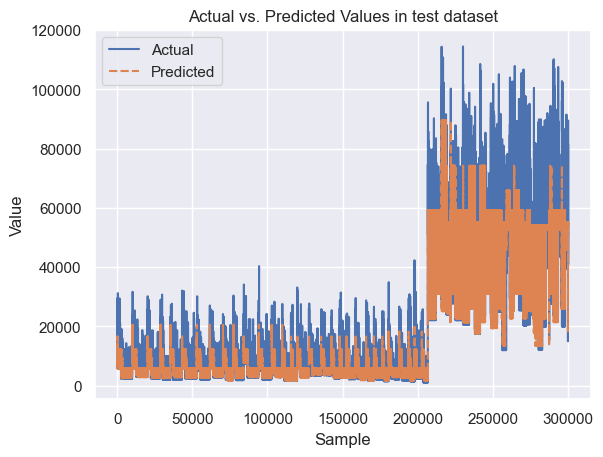

For Train data
----------------------------------------------------------
Mean Squared Error (MSE) for training dataset: 29348928.801644493
Root Mean Squared Error (RMSE) for training dataset: 5417.465163860723
Mean Absolute Error (MAE) for training dataset: 3146.9353100416197
R-squared (R²) for training dataset: 0.9430157867461413


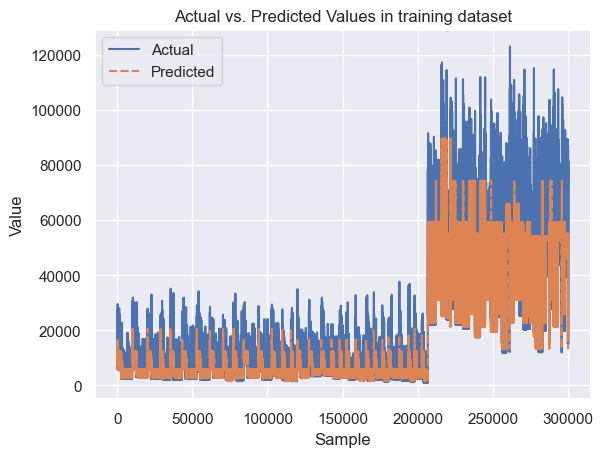

In [69]:

# Create an instance of the DecisionTreeRegressor
model_dtr = DecisionTreeRegressor()

# Define the hyperparameters
hyperparameters = {'max_depth': 6, 'min_samples_leaf': 2, 'min_samples_split': 10}

# Set the hyperparameters
model_dtr.set_params(**hyperparameters)
model_dtr.fit(x_train, y_train)

print("For Test data")
print("----------------------------------------------------------")

#model evaluate
# Make predictions on the test set
y_pred = model_dtr.predict(x_test)

# Calculate the evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R²):", r2)

#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


print("For Train data")
print("----------------------------------------------------------")

# Make predictions on the train set
y_pred = model_dtr.predict(x_train)

# Calculate the evaluation metrics
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_train, y_pred)
r2 = r2_score(y_train, y_pred)

# Print the evaluation metrics
print("Mean Squared Error (MSE) for training dataset:", mse)
print("Root Mean Squared Error (RMSE) for training dataset:", rmse)
print("Mean Absolute Error (MAE) for training dataset:", mae)
print("R-squared (R²) for training dataset:", r2)
#for train dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in training dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


## 3. KNN-regression 

In [73]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Create KNN regressor object
knn = Pipeline([
    ("scale", StandardScaler()),
    ("knn", KNeighborsRegressor(n_neighbors=5))
])

# Fit the model using the training data
knn.fit(x_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(x_test)

# Calculate evaluation metrics on test dataset
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = np.mean(abs(y_test - y_pred))
r2 = r2_score(y_test, y_pred)

# Print evaluation metrics
print("Mean Squared Error (MSE) of test dataset:", mse)
print("Root Mean Squared Error (RMSE) of test dataset:", rmse)
print("Mean Absolute Error (MAE) of test dataset:", mae)
print("R-squared (R²) of test dataset:", r2)

Mean Squared Error (MSE) of test dataset: 13502184.402870845
Root Mean Squared Error (RMSE) of test dataset: 3674.531861730259
Mean Absolute Error (MAE) of test dataset: 1883.6935522547128
R-squared (R²) of test dataset: 0.9737956749830976


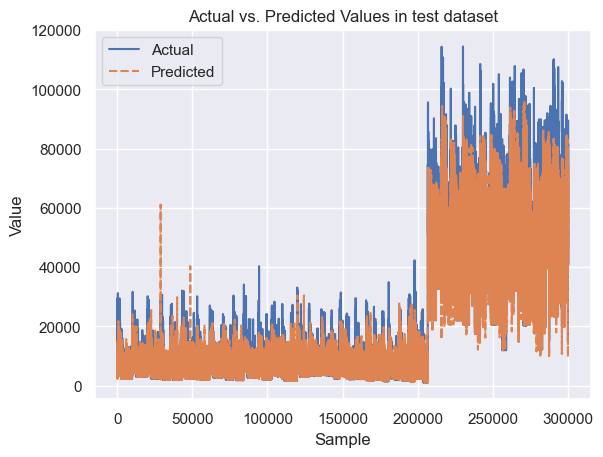

In [74]:
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


In [75]:
#evaluation on train data set
# Make predictions on the test data
y_pred = knn.predict(x_train)

# Calculate evaluation metrics on test dataset
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = np.mean(abs(y_train - y_pred))
r2 = r2_score(y_train, y_pred)

# Print evaluation metrics
print("Mean Squared Error (MSE) of train dataset:", mse)
print("Root Mean Squared Error (RMSE) of train dataset:", rmse)
print("Mean Absolute Error (MAE) of train dataset:", mae)
print("R-squared (R²) of train dataset:", r2)

Mean Squared Error (MSE) of train dataset: 8412316.3907691
Root Mean Squared Error (RMSE) of train dataset: 2900.399350222155
Mean Absolute Error (MAE) of train dataset: 1418.714778214967
R-squared (R²) of train dataset: 0.9836665510209811


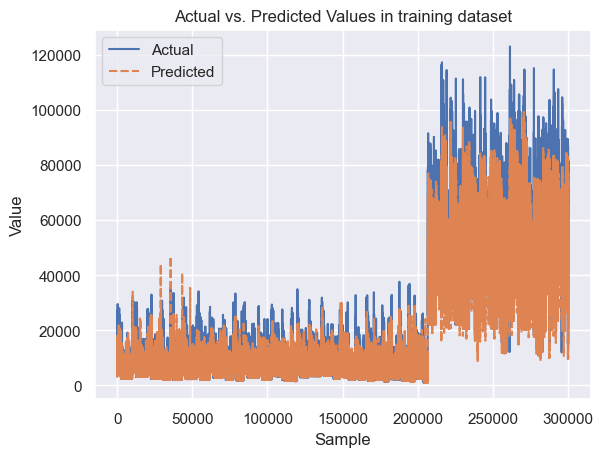

In [76]:
#for train dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in training dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

## 4.Lasso and Ridge regression

In [80]:
from sklearn.linear_model import Lasso, Ridge

# Create the Lasso and Ridge models
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=0.1)

# Fit the models on the training data
lasso.fit(x_train, y_train)
ridge.fit(x_train, y_train)

# Predict on the test data
y_pred_lasso = lasso.predict(x_test)
y_pred_ridge = ridge.predict(x_test)

# Evaluate the models using Mean Squared Error, Mean Absolute Error and r2 score
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
mae_lasso = np.mean(abs(y_test - y_pred_lasso))
r2_lasso = r2_score(y_test, y_pred_lasso)

mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = np.mean(abs(y_test - y_pred_ridge))
r2_ridge= r2_score(y_test, y_pred_ridge)

print("Lasso Regression MSE:", mse_lasso)
print("Lasso Regression MAE:", mae_lasso)
print("Lasso Regression r2 score:", r2_lasso)

print("Ridge Regression MSE:", mse_ridge)
print("Ridge Regression MAE:", mae_ridge)
print("Ridge Regression r2 score:", r2_ridge)

Lasso Regression MSE: 49211423.01353283
Lasso Regression MAE: 4783.4898108598145
Lasso Regression r2 score: 0.9044930742527336
Ridge Regression MSE: 49211375.00848459
Ridge Regression MAE: 4783.677970421711
Ridge Regression r2 score: 0.904493167418391


Lasso regression test dataset
--------------------------------------------------------------------------------------------


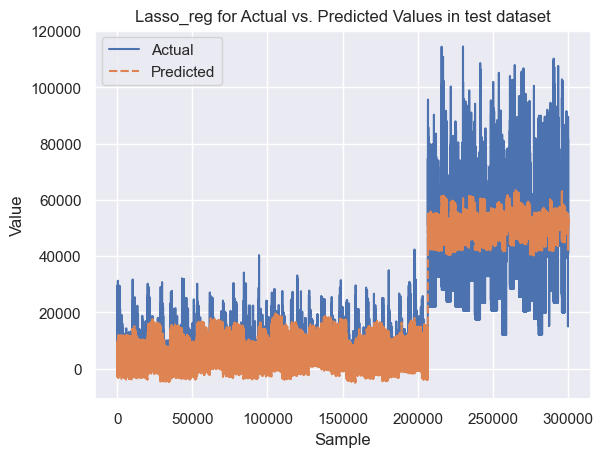

Ridge regression test data set
--------------------------------------------------------------------------------------------


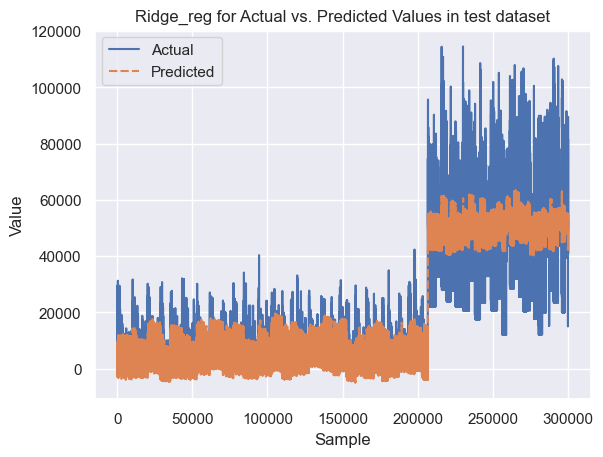

In [81]:
print("Lasso regression test dataset")
print("--------------------------------------------------------------------------------------------")
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_lasso})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Lasso_reg for Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

print("Ridge regression test data set")
print("--------------------------------------------------------------------------------------------")
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_ridge})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Ridge_reg for Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

In [82]:
# Predict on the train data
y_pred_lasso = lasso.predict(x_train)
y_pred_ridge = ridge.predict(x_train)

# Evaluate the models using Mean Squared Error, Mean Absolute Error and r2 score
mse_lasso = mean_squared_error(y_train, y_pred_lasso)
mae_lasso = np.mean(abs(y_train - y_pred_lasso))
r2_lasso = r2_score(y_train, y_pred_lasso)

mse_ridge = mean_squared_error(y_train, y_pred_ridge)
mae_ridge = np.mean(abs(y_train - y_pred_ridge))
r2_ridge= r2_score(y_train, y_pred_ridge)

print("Lasso Regression MSE:", mse_lasso)
print("Lasso Regression MAE:", mae_lasso)
print("Lasso Regression r2 score:", r2_lasso)

print("Ridge Regression MSE:", mse_ridge)
print("Ridge Regression MAE:", mae_ridge)
print("Ridge Regression r2 score:", r2_ridge)

Lasso Regression MSE: 49388861.89211347
Lasso Regression MAE: 4795.886185538619
Lasso Regression r2 score: 0.9041060252165702
Ridge Regression MSE: 49388800.76423652
Ridge Regression MAE: 4796.086650336205
Ridge Regression r2 score: 0.9041061439031499


Lasso regression train dataset
--------------------------------------------------------------------------------------------


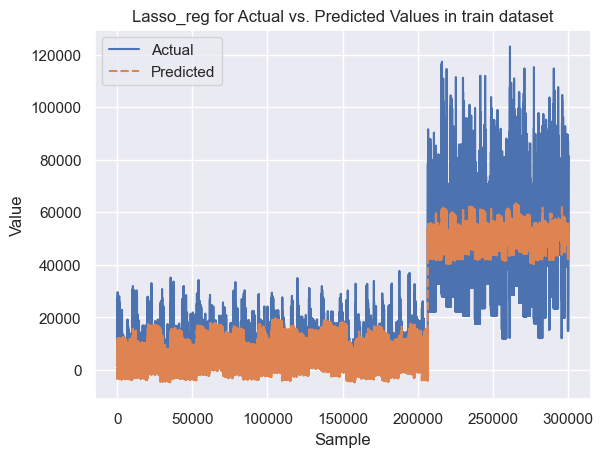

Ridge regression train data set
--------------------------------------------------------------------------------------------


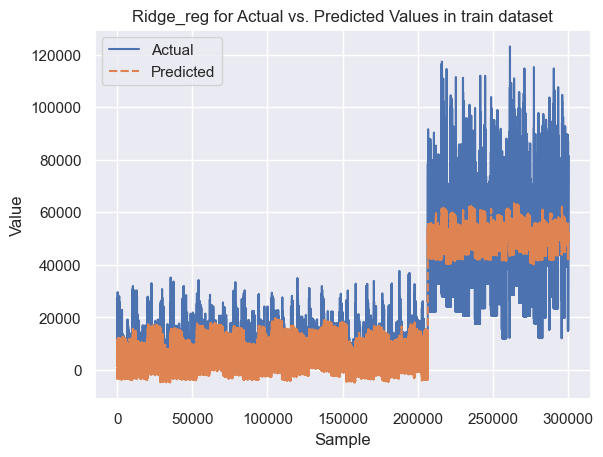

In [83]:
print("Lasso regression train dataset")
print("--------------------------------------------------------------------------------------------")
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred_lasso})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Lasso_reg for Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

print("Ridge regression train data set")
print("--------------------------------------------------------------------------------------------")
#for test dataset
# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred_ridge})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Ridge_reg for Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

### *hyper parameter tuning for lasso and ridge regression*

In [584]:
#hyper parameter tuning
# Create a pipeline for Lasso regression
lasso_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso())
])

# Create a pipeline for Ridge regression
ridge_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
])

# Define the hyperparameter grid for Lasso regression
lasso_param_grid = {'lasso__alpha': [0.001, 0.01, 0.1, 1, 10]}

# Define the hyperparameter grid for Ridge regression
ridge_param_grid = {'ridge__alpha': [0.001, 0.01, 0.1, 1, 10]}

# Define the scoring metric
scoring = 'neg_mean_squared_error'

# Perform the grid search for Lasso regression
lasso_grid_search = GridSearchCV(lasso_pipe, param_grid=lasso_param_grid, cv=5, scoring=scoring, n_jobs=-1)
lasso_grid_search.fit(x_train, y_train)

# Perform the grid search for Ridge regression
ridge_grid_search = GridSearchCV(ridge_pipe, param_grid=ridge_param_grid, cv=5, scoring=scoring, n_jobs=-1)
ridge_grid_search.fit(x_train, y_train)

# Print the best hyperparameters for Lasso regression
print('Lasso regression best hyperparameters: ', lasso_grid_search.best_params_)

# Print the best mean squared error for Lasso regression
print('Lasso regression best mean squared error: ', -lasso_grid_search.best_score_)

# Print the best hyperparameters for Ridge regression
print('Ridge regression best hyperparameters: ', ridge_grid_search.best_params_)

# Print the best mean squared error for Ridge regression
print('Ridge regression best mean squared error: ', -ridge_grid_search.best_score_)


Lasso regression best hyperparameters:  {'lasso__alpha': 0.1}
Lasso regression best mean squared error:  49402816.48189809
Ridge regression best hyperparameters:  {'ridge__alpha': 1}
Ridge regression best mean squared error:  49402816.88789401


### *after hyperparara meter tuning for lasso and ridge regression*

Lasso regression test dataset
--------------------------------------------------------------------------------------------
Lasso Regression MSE: 49211423.01353283
Lasso Regression MAE: 4783.4898108598145
Lasso Regression r2 score: 0.9044930742527336


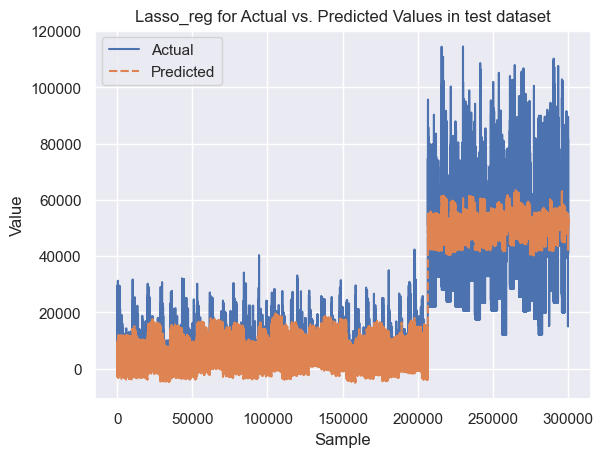

Ridge regression test data set
--------------------------------------------------------------------------------------------
Ridge Regression MSE: 49211385.56530672
Ridge Regression MAE: 4783.657862710681
Ridge Regression r2 score: 0.9044931469302693


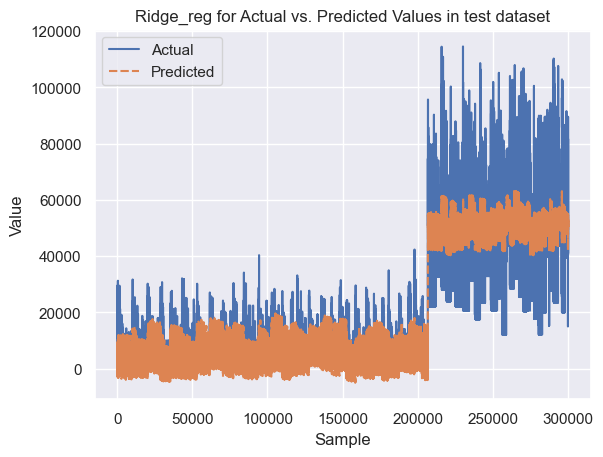

In [84]:
# Create the Lasso and Ridge models
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=1.0)

# Fit the models on the training data
lasso.fit(x_train, y_train)
ridge.fit(x_train, y_train)

# Predict on the test data
y_pred_lasso = lasso.predict(x_test)
y_pred_ridge = ridge.predict(x_test)

# Evaluate the models using Mean Squared Error, Mean Absolute Error and r2 score
mse_lasso = mean_squared_error(y_test, y_pred_lasso)
mae_lasso = np.mean(abs(y_test - y_pred_lasso))
r2_lasso = r2_score(y_test, y_pred_lasso)

mse_ridge = mean_squared_error(y_test, y_pred_ridge)
mae_ridge = np.mean(abs(y_test - y_pred_ridge))
r2_ridge= r2_score(y_test, y_pred_ridge)

print("Lasso regression test dataset")
print("--------------------------------------------------------------------------------------------")

print("Lasso Regression MSE:", mse_lasso)
print("Lasso Regression MAE:", mae_lasso)
print("Lasso Regression r2 score:", r2_lasso)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_lasso})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Lasso_reg for Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

print("Ridge regression test data set")
print("--------------------------------------------------------------------------------------------")

print("Ridge Regression MSE:", mse_ridge)
print("Ridge Regression MAE:", mae_ridge)
print("Ridge Regression r2 score:", r2_ridge)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred_ridge})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Ridge_reg for Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

Lasso regression train dataset
--------------------------------------------------------------------------------------------
Lasso Regression MSE: 49388861.89211347
Lasso Regression MAE: 4795.886185538619
Lasso Regression r2 score: 0.9041060252165702


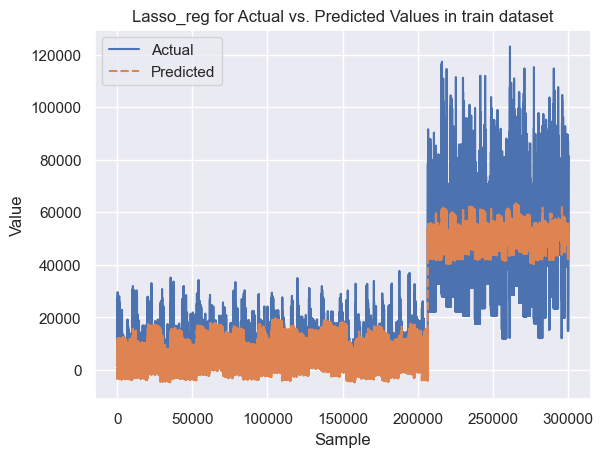

Ridge regression train data set
--------------------------------------------------------------------------------------------
Ridge Regression MSE: 49388803.69665483
Ridge Regression MAE: 4796.064685297539
Ridge Regression r2 score: 0.9041061382095332


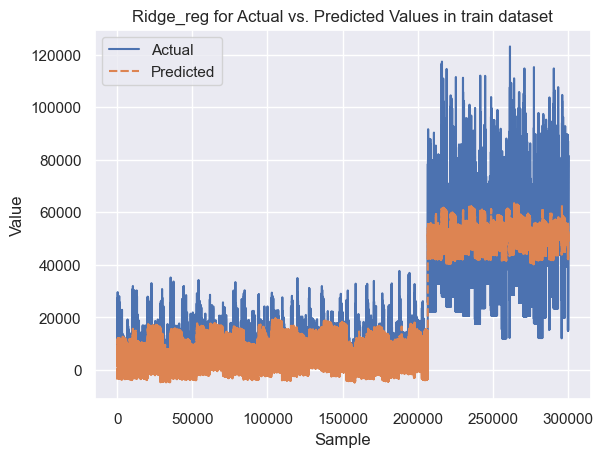

In [85]:
# Predict on the train data
y_pred_lasso = lasso.predict(x_train)
y_pred_ridge = ridge.predict(x_train)

# Evaluate the models using Mean Squared Error, Mean Absolute Error and r2 score
mse_lasso = mean_squared_error(y_train, y_pred_lasso)
mae_lasso = np.mean(abs(y_train - y_pred_lasso))
r2_lasso = r2_score(y_train, y_pred_lasso)

mse_ridge = mean_squared_error(y_train, y_pred_ridge)
mae_ridge = np.mean(abs(y_train - y_pred_ridge))
r2_ridge= r2_score(y_train, y_pred_ridge)

print("Lasso regression train dataset")
print("--------------------------------------------------------------------------------------------")

print("Lasso Regression MSE:", mse_lasso)
print("Lasso Regression MAE:", mae_lasso)
print("Lasso Regression r2 score:", r2_lasso)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred_lasso})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Lasso_reg for Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')
# Show the plot
plt.show()


print("Ridge regression train data set")
print("--------------------------------------------------------------------------------------------")

print("Ridge Regression MSE:", mse_ridge)
print("Ridge Regression MAE:", mae_ridge)
print("Ridge Regression r2 score:", r2_ridge)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred_ridge})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Ridge_reg for Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

## 5.Random Forest Regressor

For test datase
-------------------------------------------------------------------------------------
Mean Squared Error (MSE) of test dataset: 6041725.487297909
Root Mean Squared Error (RMSE) of test dataset: 2457.9921658333064
Mean Absolute Error (MAE) of test dataset: 975.9925119323392
R-squared (R²) of test dataset: 0.9882745388739917


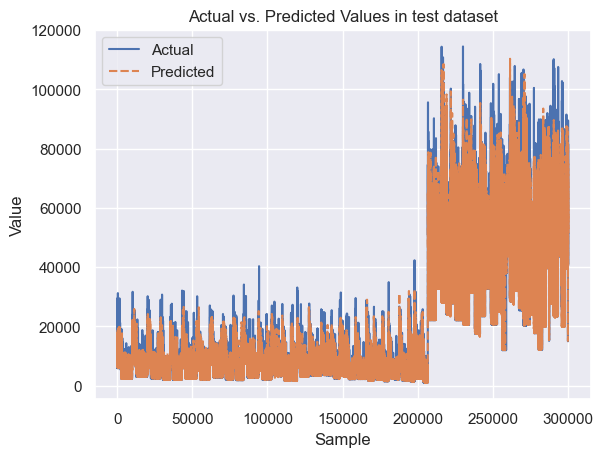

In [87]:
from sklearn.ensemble import RandomForestRegressor

# Create a Random Forest Regressor object
rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_reg.fit(x_train, y_train)

# Make predictions on the testing data
y_pred = rf_reg.predict(x_test)

# Calculate evaluation metrics on test dataset
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = np.mean(abs(y_test - y_pred))
r2 = r2_score(y_test, y_pred)

print("For test datase")
print("-------------------------------------------------------------------------------------")
# Print evaluation metrics
print("Mean Squared Error (MSE) of test dataset:", mse)
print("Root Mean Squared Error (RMSE) of test dataset:", rmse)
print("Mean Absolute Error (MAE) of test dataset:", mae)
print("R-squared (R²) of test dataset:", r2)


# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


Mean Squared Error (MSE) of train dataset: 925650.8590860454
Root Mean Squared Error (RMSE) of train dataset: 962.1075091101022
Mean Absolute Error (MAE) of train dataset: 373.4826024487737
R-squared (R²) of train dataset: 0.9982027457864213


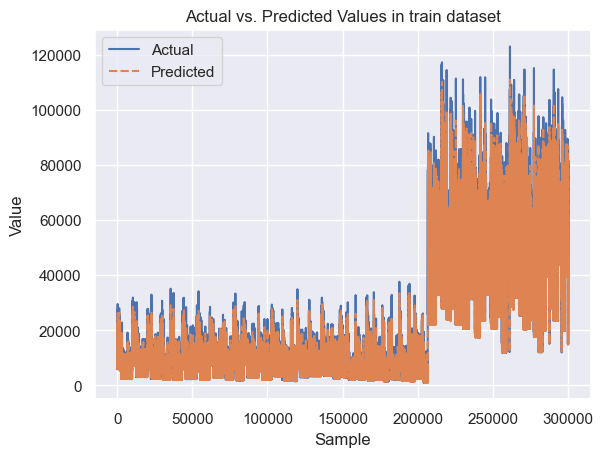

In [88]:
# Make predictions on the testing data
y_pred = rf_reg.predict(x_train)

# Calculate evaluation metrics on test dataset
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = np.mean(abs(y_train - y_pred))
r2 = r2_score(y_train, y_pred)

# Print evaluation metrics
print("Mean Squared Error (MSE) of train dataset:", mse)
print("Root Mean Squared Error (RMSE) of train dataset:", rmse)
print("Mean Absolute Error (MAE) of train dataset:", mae)
print("R-squared (R²) of train dataset:", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

## 6.XGB Regressor

Mean Squared Error (MSE): 9630794.837595511
Root Mean Squared Error (RMSE): 3103.352193611855
Mean Absolute Error (MAE): 1788.3653963721215
R-squared (R²): 0.9813090629956291


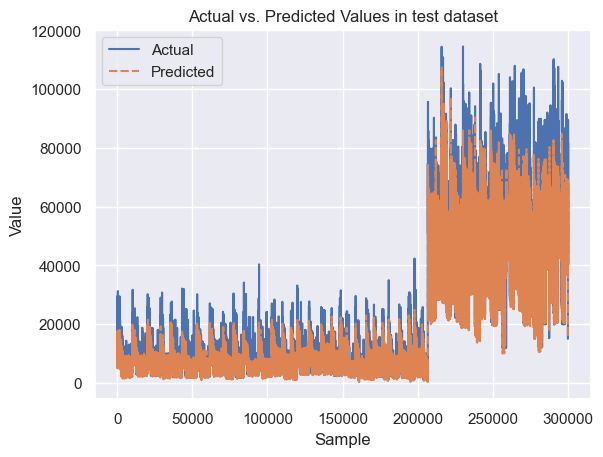

In [91]:
from xgboost import XGBRegressor

# Define XGBoost regressor model
xgb = XGBRegressor()

# Train the model
xgb.fit(x_train, y_train)

# Predict on test set
y_pred = xgb.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("Mean Absolute Error (MAE):", mae)
print("R-squared (R²):", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in test dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

Mean Squared Error (MSE) for train dataset: 9132155.583922848
Root Mean Squared Error (RMSE) for train dataset: 3021.9456619738958
Mean Absolute Error (MAE) for train dataset: 1751.8535764133946
R-squared (R²) for train dataset: 0.9822689030738144


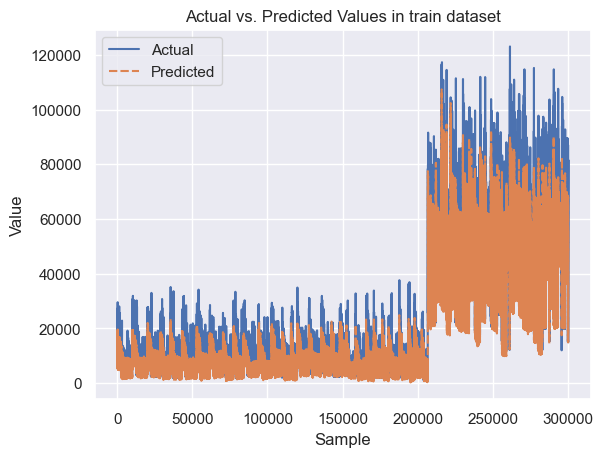

In [92]:
#for train dataset
# Predict on test set
y_pred = xgb.predict(x_train)

# Evaluate the model
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_train, y_pred)
r2 = r2_score(y_train, y_pred)

print("Mean Squared Error (MSE) for train dataset:", mse)
print("Root Mean Squared Error (RMSE) for train dataset:", rmse)
print("Mean Absolute Error (MAE) for train dataset:", mae)
print("R-squared (R²) for train dataset:", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

In [94]:
from sklearn.metrics import make_scorer

# Define the XGBoost regressor model
xgb = XGBRegressor()

# Define the hyperparameter grid
param_grid = {'learning_rate': [0.1, 0.3, 0.5],
              'max_depth': [3, 5, 7]}

# Define the scoring metrics
scoring = {'MSE': make_scorer(mean_squared_error)}

# Perform the grid search
grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, scoring=scoring, refit='MSE')

# Fit the grid search to the data
grid_search.fit(x_train, y_train)

# Print the best hyperparameters
print("Best hyperparameters:", grid_search.best_params_)

# Print the best score
print("Best MSE score:", -grid_search.cv_results_['mean_test_MSE'][grid_search.best_index_])


Best hyperparameters: {'learning_rate': 0.1, 'max_depth': 3}
Best MSE score: -25221526.417109784


### *After hyperparameter tuning*

for test dataset
------------------------------------------------------------------------------
Mean Squared Error (MSE) for test dataset: 25169837.314397532
Root Mean Squared Error (RMSE) for test dataset: 5016.954984290524
Mean Absolute Error (MAE) for test dataset: 2995.9348930711735
R-squared (R²) for test dataset: 0.9511517116098048


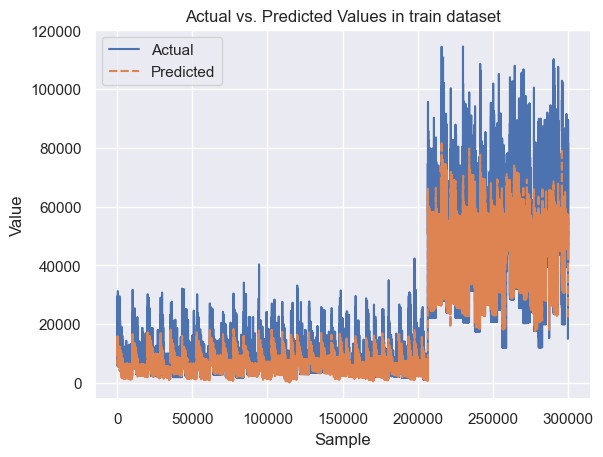

for train dataset
-------------------------------------------------------------------------------
Mean Squared Error (MSE) for train dataset: 24982764.661781143
Root Mean Squared Error (RMSE) for train dataset: 4998.276169018789
Mean Absolute Error (MAE) for train dataset: 2987.1816014341
R-squared (R²) for train dataset: 0.9514931805934214


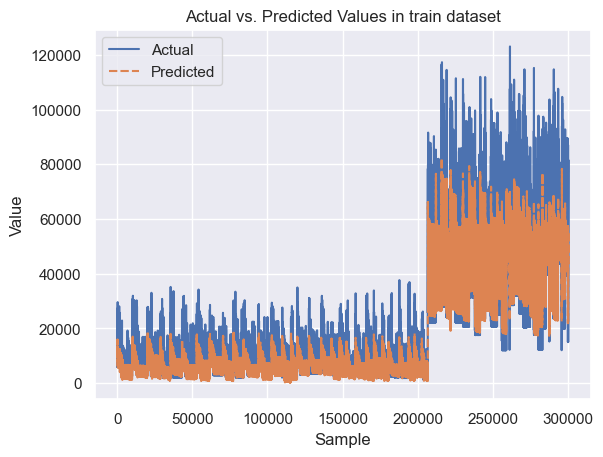

In [59]:
from xgboost import XGBRegressor
from sklearn.metrics import make_scorer

xgb_model = XGBRegressor(learning_rate=0.1,max_depth=3)

xgb_model.fit(x_train,y_train)
print("for test dataset")
print("------------------------------------------------------------------------------")
# Predict on test set
y_pred = xgb_model.predict(x_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error (MSE) for test dataset:", mse)
print("Root Mean Squared Error (RMSE) for test dataset:", rmse)
print("Mean Absolute Error (MAE) for test dataset:", mae)
print("R-squared (R²) for test dataset:", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()


print("for train dataset")
print("-------------------------------------------------------------------------------")
#for train dataset
# Predict on test set
y_pred = xgb_model.predict(x_train)

# Evaluate the model
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_train, y_pred)
r2 = r2_score(y_train, y_pred)

print("Mean Squared Error (MSE) for train dataset:", mse)
print("Root Mean Squared Error (RMSE) for train dataset:", rmse)
print("Mean Absolute Error (MAE) for train dataset:", mae)
print("R-squared (R²) for train dataset:", r2)

# Combine the actual and predicted values into a single dataframe
data = pd.DataFrame({'Actual': y_train, 'Predicted': y_pred})

# Create a line plot using Seaborn
sns.set(style="darkgrid")
sns.lineplot(data=data)

# Set the title, x-label, and y-label of the plot
plt.title('Actual vs. Predicted Values in train dataset')
plt.xlabel('Sample')
plt.ylabel('Value')

# Show the plot
plt.show()

### main factors for ticket pricing

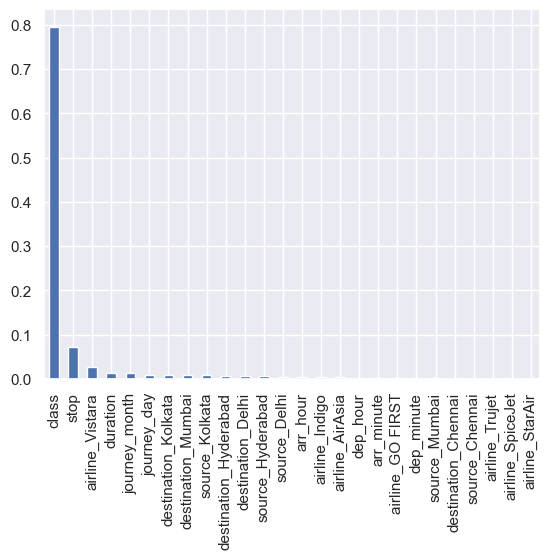

In [61]:
feature_im=pd.Series(data=xgb_model.feature_importances_,index=['duration', 'stop', 'class', 'journey_day', 'journey_month', 'dep_hour',
       'dep_minute', 'arr_hour', 'arr_minute', 'airline_AirAsia',
       'airline_GO FIRST', 'airline_Indigo', 'airline_SpiceJet',
       'airline_StarAir', 'airline_Trujet', 'airline_Vistara',
       'source_Chennai', 'source_Delhi', 'source_Hyderabad', 'source_Kolkata',
       'source_Mumbai', 'destination_Chennai', 'destination_Delhi',
       'destination_Hyderabad', 'destination_Kolkata', 'destination_Mumbai'])
feature_im=feature_im.sort_values(ascending=False).plot.bar()

In [99]:
import pickle

with open ("flight_fare_model.pkl","wb") as f:
    pickle.dump(xgb_model,f)